In [1]:
from numpy import expand_dims
from matplotlib import pyplot
from PIL import Image
from numpy import asarray
import numpy as np
import pandas as pd
from mtcnn.mtcnn import MTCNN
import tensorflow as tf
from keras_vggface.vggface import VGGFace
from keras_vggface.utils import preprocess_input
from keras_vggface.utils import decode_predictions
from tensorflow.keras.losses import MSE
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.image import imsave
import os
import cv2

from scipy.spatial.distance import cosine

mpl.rcParams['figure.figsize'] = (8, 8)
mpl.rcParams['axes.grid'] = False

In [2]:
# pip install -q adversarial-robustness-toolbox[all]

In [3]:
# import art
# from art import config
# from art.estimators.classification import KerasClassifier
# from art.attacks.evasion import FastGradientMethod, BasicIterativeMethod, ProjectedGradientDescent

In [4]:
# extract a single face from a given photograph
def extract_face(filename, required_size=(224, 224)):
    # load image from file
    pixels = pyplot.imread(filename)
    # create the detector, using default weights
    detector = MTCNN()
    # detect faces in the image
    results = detector.detect_faces(pixels)
    # extract the bounding box from the first face
    x1, y1, width, height = results[0]['box']
    x2, y2 = x1 + width, y1 + height
    # extract the face
    face = pixels[y1:y2, x1:x2]
    # face = pixels
    # resize pixels to the model size
    image = Image.fromarray(face)
    image = image.resize(required_size)
    face_array = asarray(image)
    return face_array

In [5]:
def FGSM(clean_image, epsilon, label):

    model_prediction = model(clean_image)
    loss_object = tf.keras.losses.CategoricalCrossentropy()

    target_label = tf.one_hot(label, model_prediction.shape[-1])
    target_label = tf.reshape(target_label, (1, model_prediction.shape[-1]))

    tensor_image = tf.convert_to_tensor(clean_image)

    with tf.GradientTape() as tape:
        tape.watch(tensor_image)
        prediction = model(tensor_image)
        loss = loss_object(target_label, prediction)
        # loss = MSE(target_label, prediction)

    gradient = tape.gradient(loss, tensor_image)
    perturbation = tf.sign(gradient)
    
    adversarial_image = clean_image + epsilon*perturbation*255
    adversarial_image = tf.clip_by_value(adversarial_image, 0, 255)
    noise = epsilon*perturbation
    return adversarial_image, noise

In [6]:
# create a vggface model including the classifer (the entire model)
model = VGGFace(model='resnet50')

In [7]:
# folder path
dir_path = r'C:\\Users\\farha\\OneDrive\\Desktop\\Farhad\\GaTech\\Deep Learning\\Project\\'
dir_original = dir_path + r"Photos\\"
dir_adv = dir_path + r"Aversarial\\"
images = os.listdir(dir_original)
print(images)

['Angelina_Jolie_01.jpg', 'Angelina_Jolie_02.jpg', 'Angelina_Jolie_03.jpg', 'Angelina_Jolie_04.jpg', 'Angelina_Jolie_05.jpg', 'Angelina_Jolie_06.jpg', 'Angelina_Jolie_07.jpg', 'Angelina_Jolie_08.jpg', 'Angelina_Jolie_09.jpg', 'Angelina_Jolie_10.jpg', 'Brad_Pitt_01.jpg', 'Brad_Pitt_02.jpg', 'Brad_Pitt_03.jpg', 'Brad_Pitt_04.jpg', 'Brad_Pitt_05.jpg', 'Brad_Pitt_06.jpg', 'Brad_Pitt_07.jpg', 'Brad_Pitt_08.jpg', 'Brad_Pitt_09.jpg', 'Brad_Pitt_10.jpg', 'Emma_Stone_01.jpg', 'Emma_Stone_02.jpg', 'Emma_Stone_03.jpg', 'Emma_Stone_04.jpg', 'Emma_Stone_05.jpg', 'Emma_Stone_06.jpg', 'Emma_Stone_07.jpg', 'Emma_Stone_08.jpg', 'Emma_Stone_09.jpg', 'Emma_Stone_10.jpg', 'Julia_Roberts_01.jpg', 'Julia_Roberts_02.jpg', 'Julia_Roberts_03.jpg', 'Julia_Roberts_04.jpg', 'Julia_Roberts_05.jpg', 'Julia_Roberts_06.jpg', 'Julia_Roberts_07.jpg', 'Julia_Roberts_08.jpg', 'Julia_Roberts_09.jpg', 'Julia_Roberts_10.jpg', 'Robert_De_Niro_01.jpg', 'Robert_De_Niro_02.jpg', 'Robert_De_Niro_03.jpg', 'Robert_De_Niro_04.jpg',

In [8]:
LABELS1 = np.load('rcmalli_vggface_labels_v1.npy')
LABELS2 = np.load('rcmalli_vggface_labels_v2.npy')
labels = LABELS1.tolist()+LABELS2.tolist()

In [9]:
df = pd.DataFrame(labels)
# df.to_csv('LIST.csv')

In [10]:
# eps = [0.01, 0.015, 0.02, 0.03] # 0.015
epsilon = 0.015
adversarials = []
noises = []

In [11]:
embeddings_original = []
embedding_adv = []

------------------------------


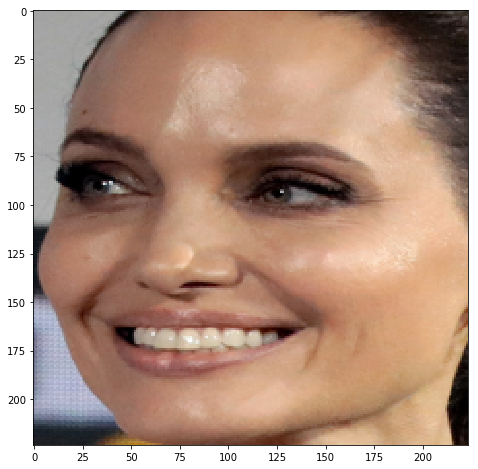

analyzing photo of Angelina_Jolie_01.jpg
b' Val\xc3\xa9rie_B\xc3\xa8gue': 14.519%
b' Meseda_Bagaudinova': 14.342%
b' Song\xc3\xbcl_\xc3\x96den': 9.099%
b' D\xc3\xa9bora_Nascimento': 3.572%
b' B\xc3\xa1rbara_Palacios': 3.555%
------------------------------


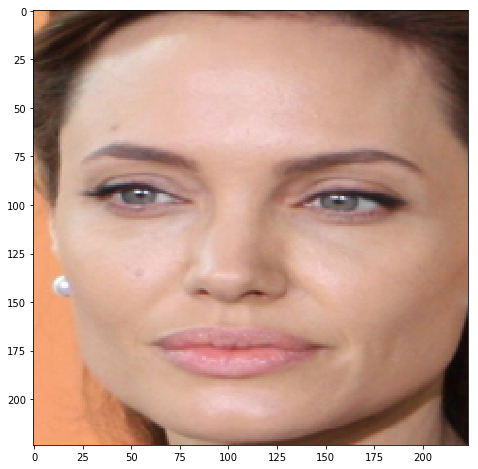

analyzing photo of Angelina_Jolie_02.jpg
b' \xc5\x9eevval_Sam': 10.605%
b' M\xc3\xa4dchen_Amick': 6.344%
b' Val\xc3\xa9rie_B\xc3\xa8gue': 5.023%
b' B\xc3\xa1rbara_Palacios': 4.129%
b' Meryem_Uzerli': 4.015%
------------------------------


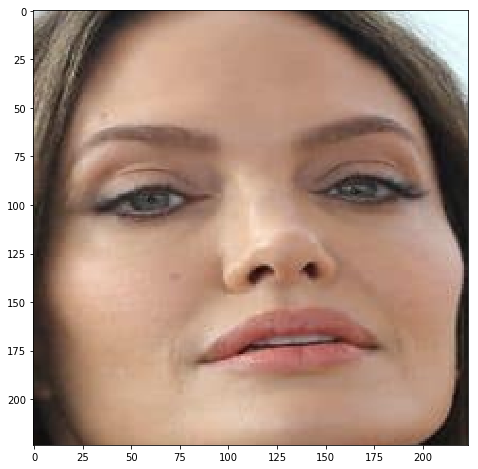

analyzing photo of Angelina_Jolie_03.jpg
b' Sultan_Hurre': 17.160%
b' Deniz_Akkaya': 6.955%
b' Meryem_Uzerli': 5.454%
b' Jessiqa_Pace': 5.371%
b' Delphine_Chan\xc3\xa9ac': 4.673%
------------------------------


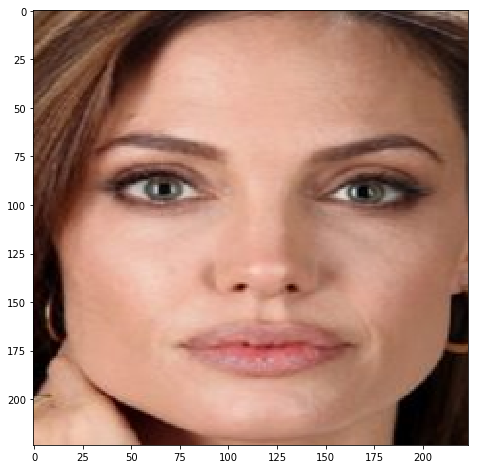

analyzing photo of Angelina_Jolie_04.jpg
b' Minka_Kelly': 8.984%
b' Meryem_Uzerli': 5.803%
b' Genta_Ismajli': 5.306%
b' Reby_Sky': 4.291%
b' Patricia_Navidad': 4.046%
------------------------------


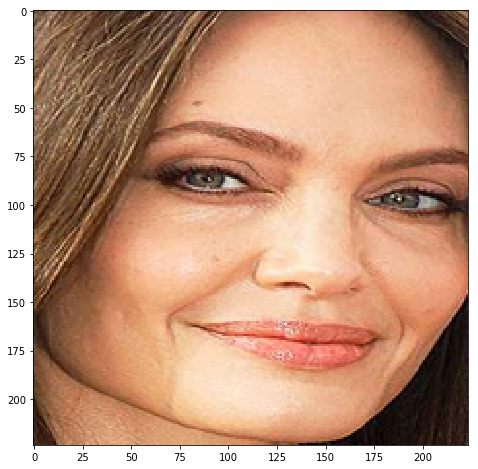

analyzing photo of Angelina_Jolie_05.jpg
b' B\xc3\xa1rbara_Palacios': 21.925%
b' Lu\xc3\xadza_Brunet': 4.772%
b' Pen\xc3\xa9lope_Menchaca': 3.746%
b' Elnaz_Shakerdoust': 2.641%
b' Willemijn_Verkaik': 2.590%
------------------------------


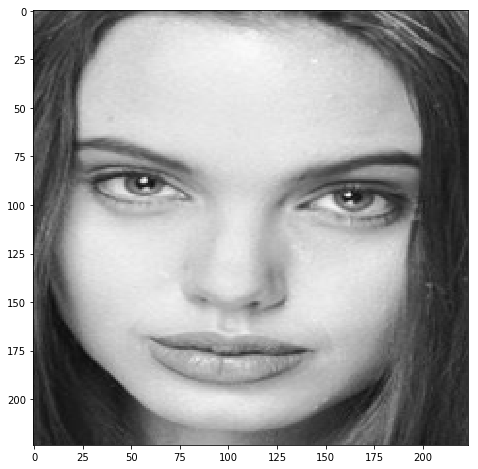

analyzing photo of Angelina_Jolie_06.jpg
b' Stella_Hudgens': 20.475%
b' Milena_Toscano': 6.675%
b' Elianne_Smit': 6.452%
b' Bailee_Madison': 5.337%
b' Lindsey_Wixson': 3.451%
------------------------------


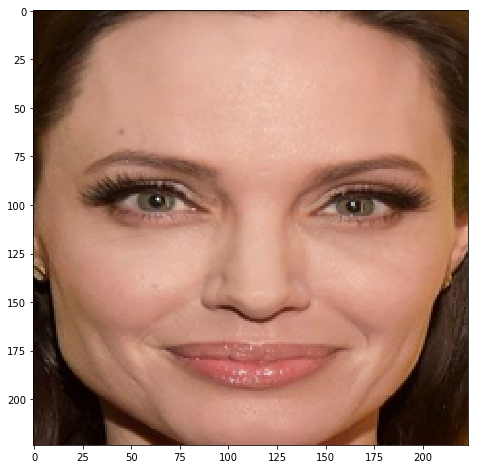

analyzing photo of Angelina_Jolie_07.jpg
b' Neha_Dhupia': 38.484%
b' Rose_Byrne': 11.571%
b' Meseda_Bagaudinova': 4.192%
b' Amy_Brenneman': 2.901%
b' Drew_Barrymore': 1.695%
------------------------------


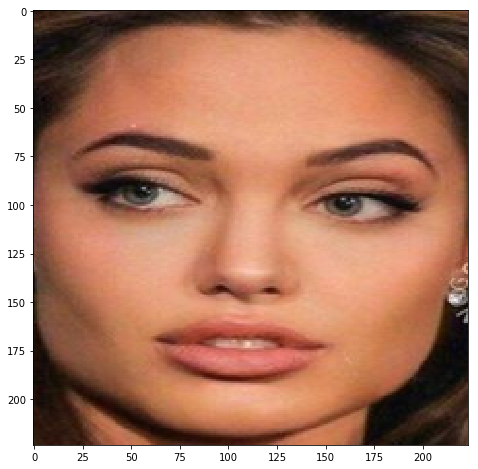

analyzing photo of Angelina_Jolie_08.jpg
b' Reby_Sky': 14.056%
b' Ariana_Grande': 4.897%
b' Meryem_Uzerli': 4.257%
b' Iman_Ali': 3.364%
b' Lisalla_Montenegro': 2.936%
------------------------------


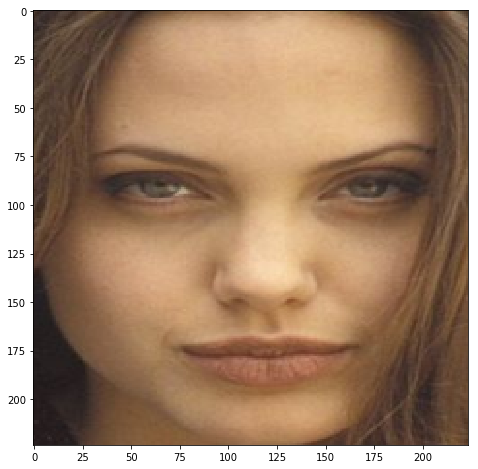

analyzing photo of Angelina_Jolie_09.jpg
b' Lindsey_Wixson': 70.550%
b' Aimee_Teegarden': 7.965%
b' Milena_Toscano': 2.297%
b' Jimi_Blue_Ochsenknecht': 1.906%
b' Meryem_Uzerli': 1.621%
------------------------------


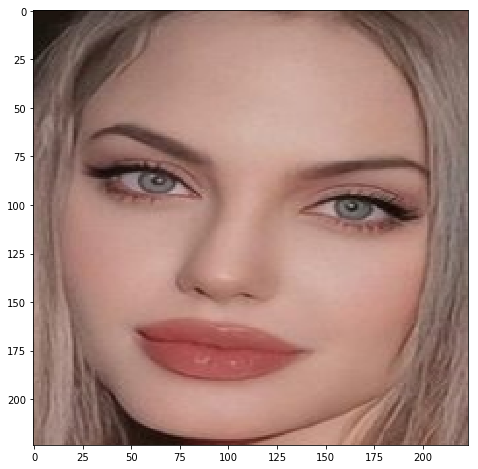

analyzing photo of Angelina_Jolie_10.jpg
b' Caitlin_Upton': 8.160%
b' Meryem_Uzerli': 4.537%
b' Sultan_Hurre': 4.406%
b' Lindsey_Wixson': 3.447%
b' Vanessa_Hessler': 3.355%
------------------------------


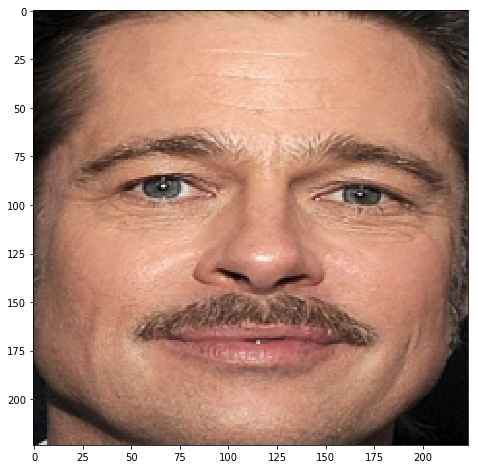

analyzing photo of Brad_Pitt_01.jpg
b' Brad_Pitt': 99.930%
b' Jack_Layton': 0.017%
b' Abd\xc3\xbcllatif_\xc5\x9eener': 0.015%
b' Luther_Vandross': 0.002%
b' Chad_Lowe': 0.002%
------------------------------


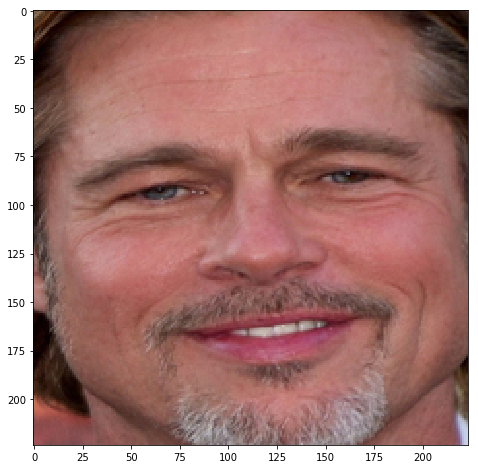

analyzing photo of Brad_Pitt_02.jpg
b' Brad_Pitt': 99.383%
b' Patrik_Antonius': 0.061%
b' Dieter_Bohlen': 0.024%
b' Rob_Lowe': 0.023%
b' Jack_Layton': 0.018%
------------------------------


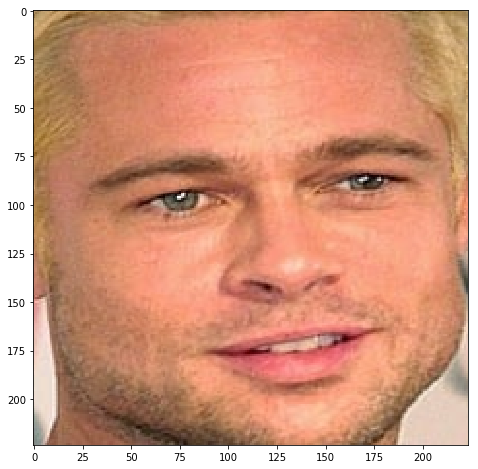

analyzing photo of Brad_Pitt_03.jpg
b' Brad_Pitt': 98.804%
b' Sebastian_Spence': 0.089%
b' David_Draiman': 0.087%
b' Rob_Lowe': 0.056%
b' Christophe_Ma\xc3\xa9': 0.054%
------------------------------


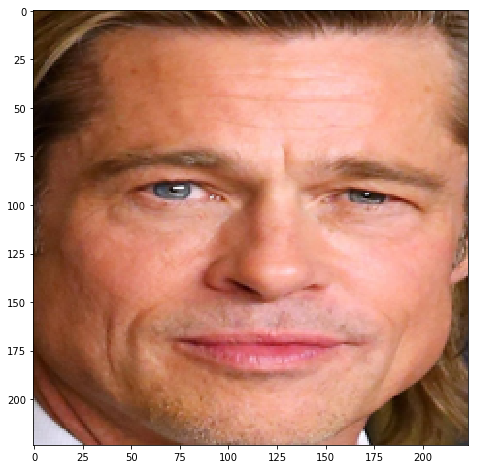

analyzing photo of Brad_Pitt_04.jpg
b' Brad_Pitt': 98.806%
b' Jeroen_van_der_Boom': 0.086%
b' David_Hasselhoff': 0.083%
b' Rob_Lowe': 0.064%
b' David_Hallyday': 0.059%
------------------------------


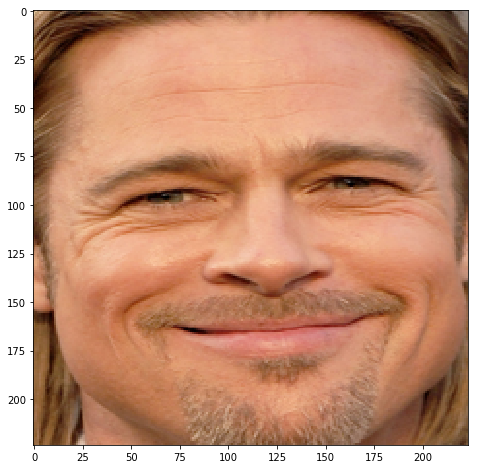

analyzing photo of Brad_Pitt_05.jpg
b' Brad_Pitt': 99.854%
b' Rob_Lowe': 0.055%
b' Gary_Dourdan': 0.006%
b' Christopher_Nolan': 0.006%
b' Chad_Lowe': 0.006%
------------------------------


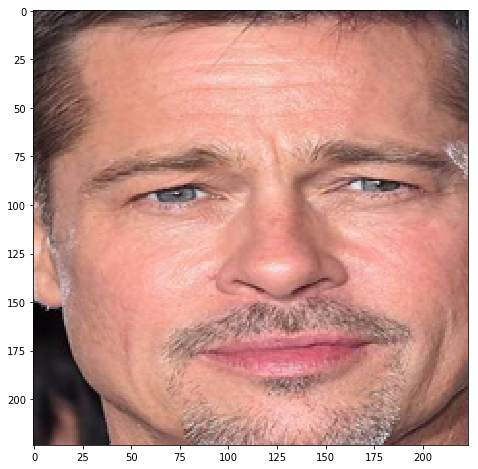

analyzing photo of Brad_Pitt_06.jpg
b' Brad_Pitt': 99.995%
b' Sebastian_Spence': 0.001%
b' Jeroen_van_der_Boom': 0.000%
b' David_Hasselhoff': 0.000%
b' Patrik_Antonius': 0.000%
------------------------------


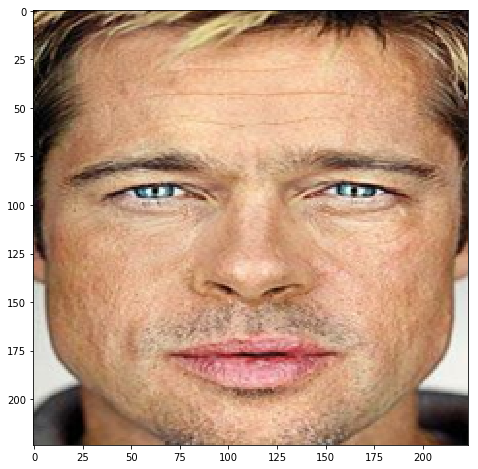

analyzing photo of Brad_Pitt_07.jpg
b' Brad_Pitt': 99.888%
b' Jeroen_van_der_Boom': 0.018%
b' Clay_Walker': 0.012%
b' Sebastian_Spence': 0.005%
b' Lovasi_Andr\xc3\xa1s': 0.004%
------------------------------


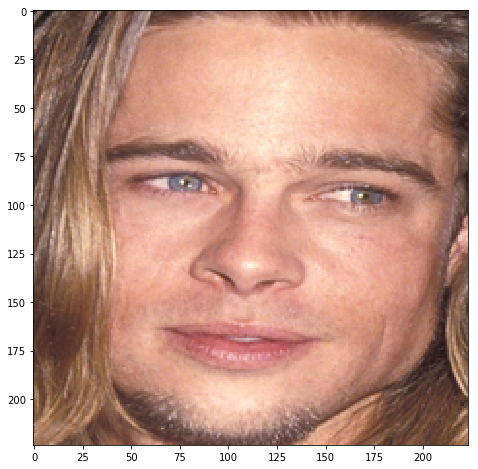

analyzing photo of Brad_Pitt_08.jpg
b' Brad_Pitt': 99.372%
b' David_Hallyday': 0.071%
b' Erik_von_Detten': 0.036%
b' Rob_Lowe': 0.031%
b' Clay_Walker': 0.013%
------------------------------


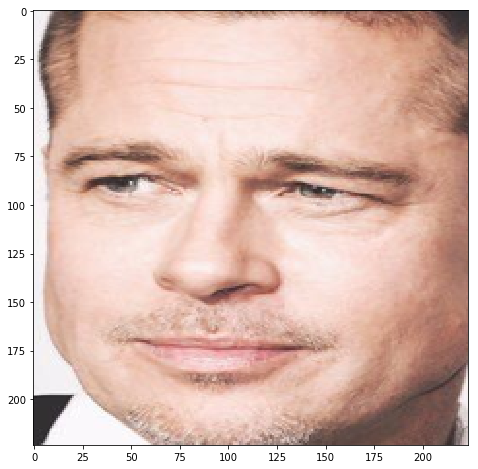

analyzing photo of Brad_Pitt_09.jpg
b' Brad_Pitt': 86.466%
b' Daniel_Landa': 1.538%
b' Bryant_Gumbel': 0.576%
b' Charley_Pride': 0.478%
b' Nick_Faldo': 0.361%
------------------------------


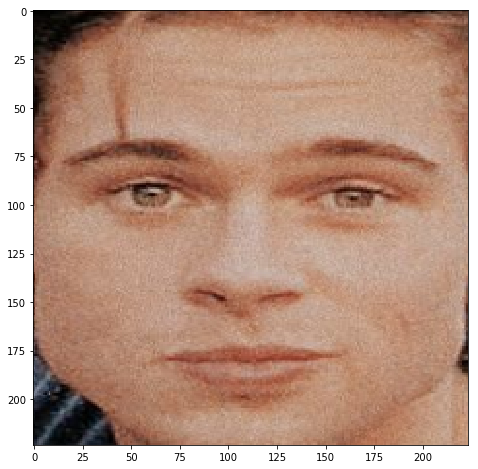

analyzing photo of Brad_Pitt_10.jpg
b' Brad_Pitt': 76.591%
b' Ryan_Cabrera': 4.268%
b' Rob_Lowe': 2.601%
b' Connor_Paolo': 2.291%
b' Erik_von_Detten': 1.624%
------------------------------


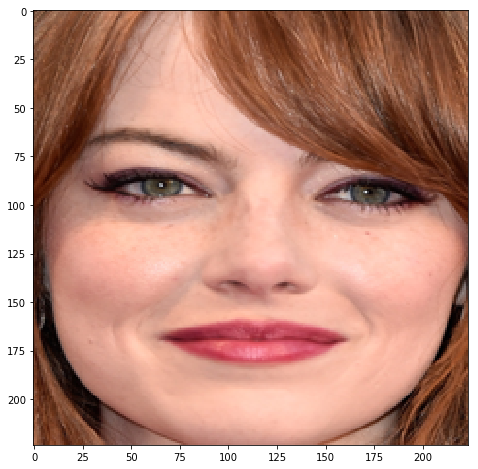

analyzing photo of Emma_Stone_01.jpg
b' Claudia_Gerini': 5.146%
b' Sultan_Hurre': 5.105%
b' Laurie_David': 4.912%
b' Bijou_Phillips': 4.032%
b' Carina_Vogt': 3.732%
------------------------------


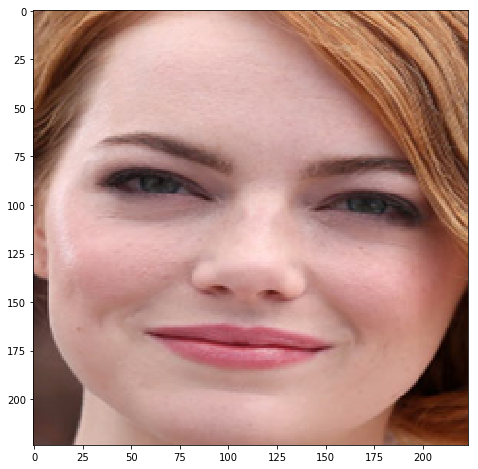

analyzing photo of Emma_Stone_02.jpg
b' Terri_Ivens': 16.137%
b' Ellen_Rocche': 5.527%
b' M\xc3\xa4dchen_Amick': 3.132%
b' Lily_Aldridge': 3.094%
b' Lu\xc3\xadza_Brunet': 3.042%
------------------------------


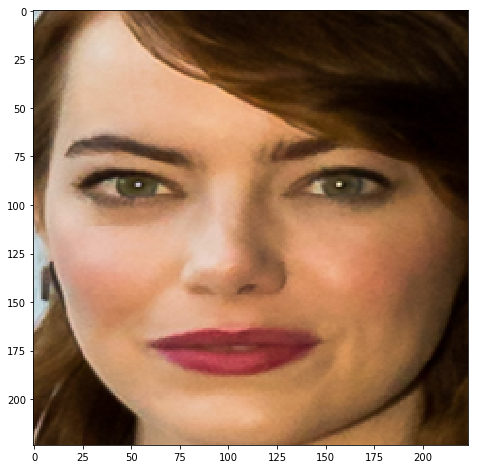

analyzing photo of Emma_Stone_03.jpg
b' Ana_Paula_Ar\xc3\xb3sio': 6.648%
b' Laurie_David': 6.522%
b' Filippa_Hamilton': 6.007%
b' Eva_Herman': 4.313%
b' M\xc3\xa4dchen_Amick': 3.928%
------------------------------


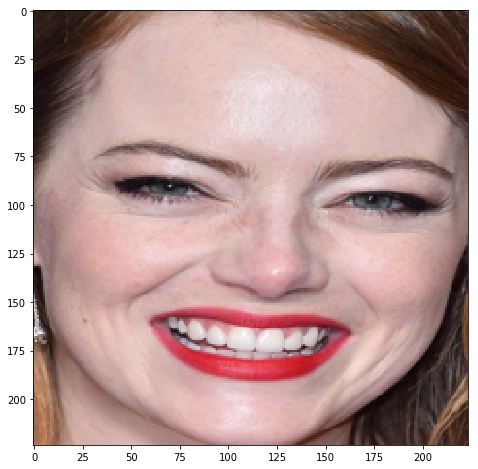

analyzing photo of Emma_Stone_04.jpg
b' Holly_Weber': 8.219%
b' Ebru_G\xc3\xbcnde\xc5\x9f': 7.283%
b' Jewel_Mische': 6.838%
b' Jessica_Stroup': 4.842%
b' Ellen_Rocche': 4.711%
------------------------------


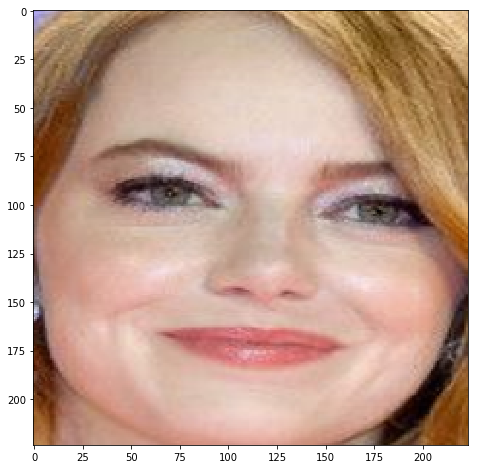

analyzing photo of Emma_Stone_05.jpg
b' Bijou_Phillips': 8.516%
b' Jewel_Mische': 5.634%
b' M\xc3\xa4dchen_Amick': 4.647%
b' Laurie_David': 3.861%
b' Ebru_G\xc3\xbcnde\xc5\x9f': 3.510%
------------------------------


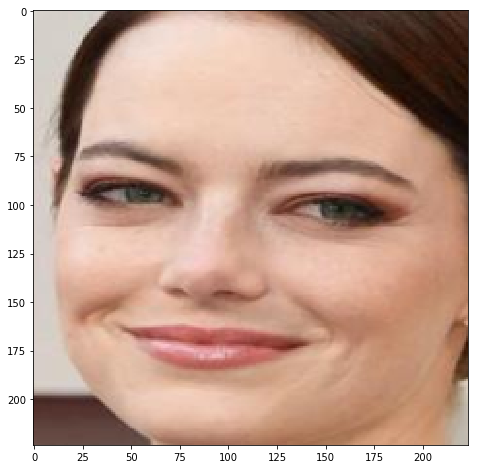

analyzing photo of Emma_Stone_06.jpg
b' Laurie_David': 14.307%
b' Holly_Weber': 6.190%
b' Anna_Mucha': 5.592%
b' Laura_Cosoi': 3.711%
b' Coraima_Torres': 3.062%
------------------------------


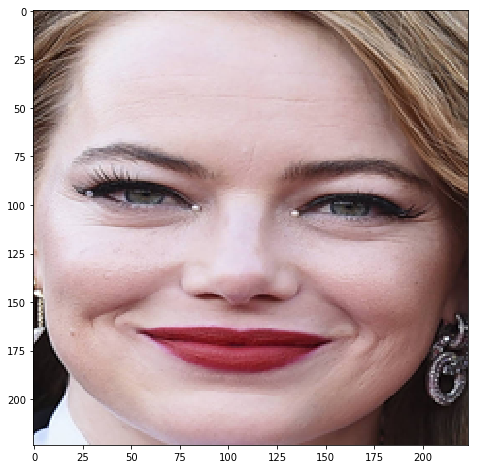

analyzing photo of Emma_Stone_07.jpg
b' Mackenzie_Foy': 12.131%
b' Eva_Herman': 6.627%
b' Bijou_Phillips': 5.015%
b' Julia_Kl\xc3\xb6ckner': 2.760%
b' Jewel_Mische': 2.642%
------------------------------


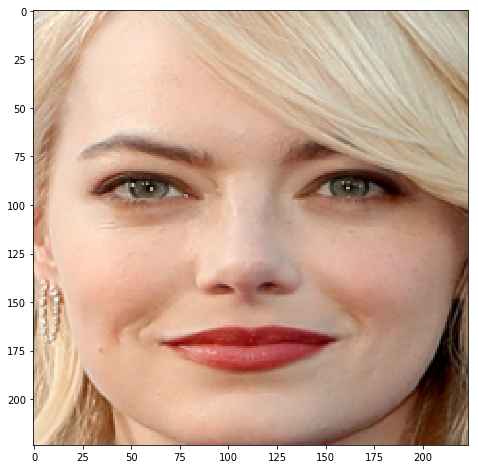

analyzing photo of Emma_Stone_08.jpg
b' Eva_Herman': 69.138%
b' Jaime_Pressly': 3.451%
b' Bijou_Phillips': 3.194%
b' Julia_Kl\xc3\xb6ckner': 1.989%
b' Shelley_Craft': 1.885%
------------------------------


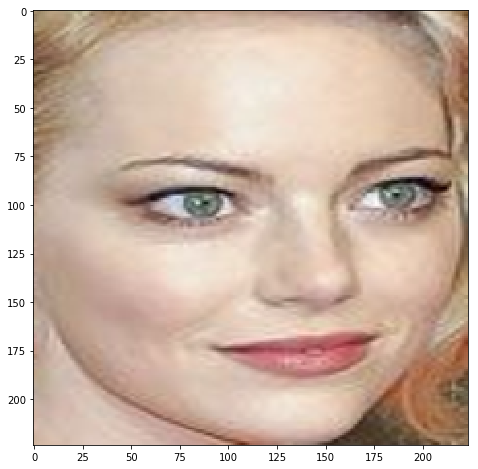

analyzing photo of Emma_Stone_09.jpg
b' Bijou_Phillips': 60.760%
b' Yael_Bar_Zohar': 2.428%
b' Vildan_Atasever': 2.413%
b' Amy_Paffrath': 2.204%
b' Holly_Weber': 1.622%
------------------------------


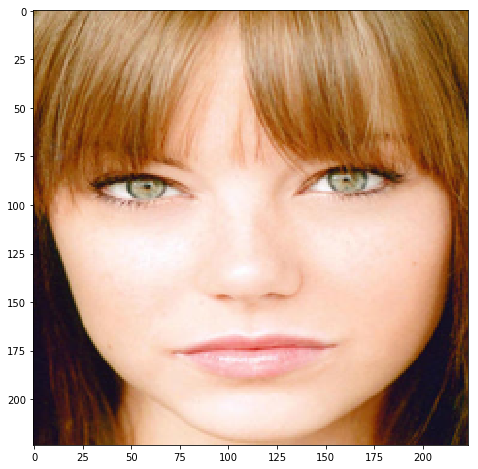

analyzing photo of Emma_Stone_10.jpg
b' Annette_Obrestad': 5.864%
b' Mary_Portas': 5.472%
b' Indiana_Evans': 2.688%
b' Elyse_Taylor': 2.509%
b' Roma_G\xc4\x85siorowska': 2.288%
------------------------------


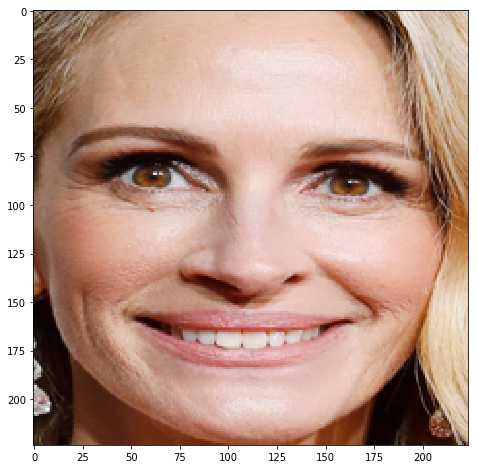

analyzing photo of Julia_Roberts_01.jpg
b' Sally_Pressman': 49.163%
b' Sandrine_Corman': 11.707%
b' Britt_Hagedorn': 4.023%
b' Camille_Anderson': 3.569%
b' Livinia_Nixon': 1.729%
------------------------------


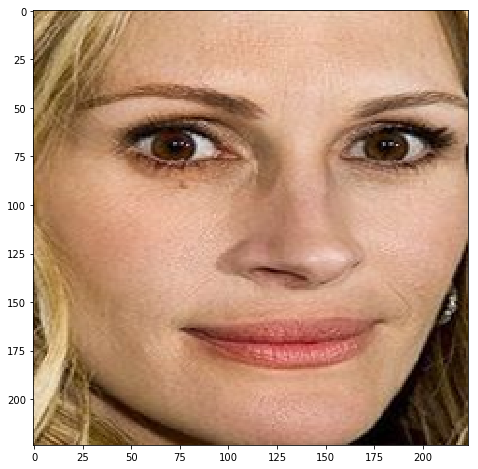

analyzing photo of Julia_Roberts_02.jpg
b' Sandrine_Corman': 22.874%
b' Bridget_Hall': 4.609%
b' Natalia_Rybicka': 4.085%
b' Lorella_Cuccarini': 4.035%
b' Sally_Pressman': 2.431%
------------------------------


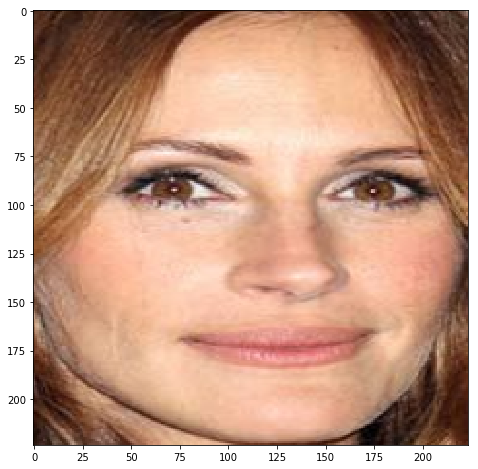

analyzing photo of Julia_Roberts_03.jpg
b' Inma_Shara': 10.794%
b' Mariska_Hargitay': 7.396%
b' Melania_Trump': 5.065%
b' Agnieszka_Maciag': 4.840%
b' Sandrine_Corman': 3.805%
------------------------------


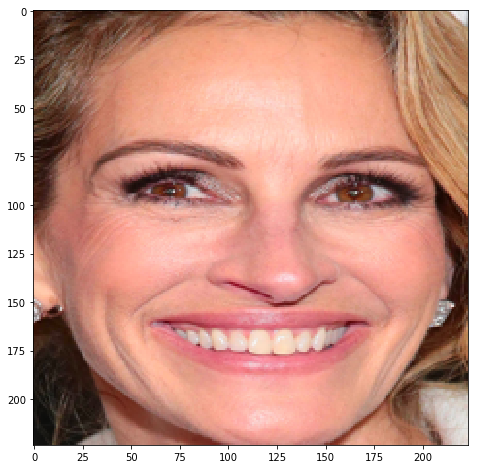

analyzing photo of Julia_Roberts_04.jpg
b' Mariska_Hargitay': 16.418%
b' Agnieszka_Maciag': 12.448%
b' Inma_Shara': 9.218%
b' Chrishell_Stause': 2.870%
b' Britt_Hagedorn': 2.797%
------------------------------


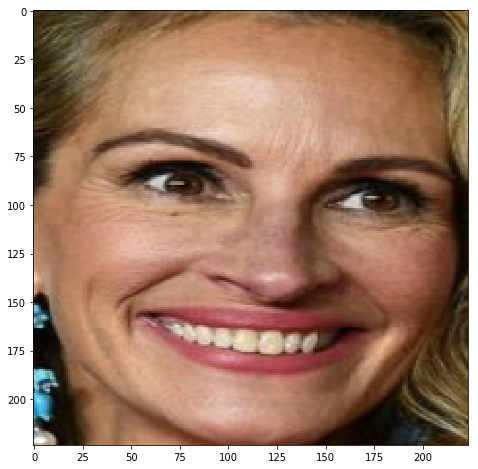

analyzing photo of Julia_Roberts_05.jpg
b' Britt_Hagedorn': 14.936%
b' Kina_Malpartida': 10.880%
b' Heather_Mitts': 6.823%
b' Bodil_J\xc3\xb8rgensen': 5.112%
b' Vanessa_Demouy': 1.870%
------------------------------


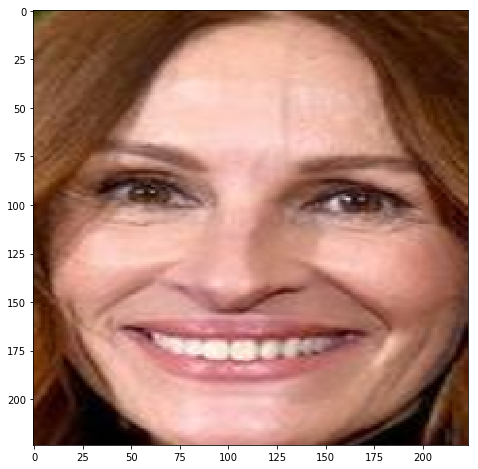

analyzing photo of Julia_Roberts_06.jpg
b' Aleksandra_Radovi\xc4\x87': 17.439%
b' Ay\xc5\x9feg\xc3\xbcl_Aldin\xc3\xa7': 11.397%
b' Mariska_Hargitay': 10.370%
b' Nora_Berra': 6.714%
b' Ariadne_Artiles': 2.874%
------------------------------


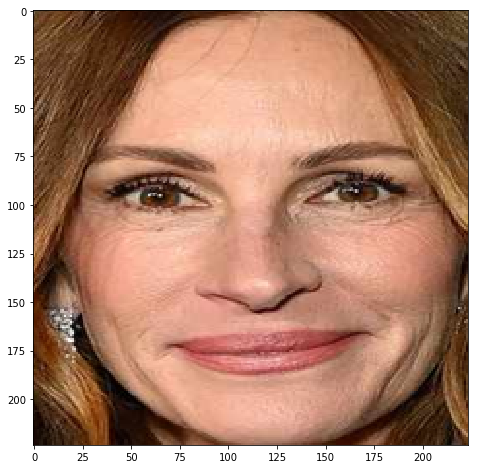

analyzing photo of Julia_Roberts_07.jpg
b' Mariska_Hargitay': 45.939%
b' Jill_Kargman': 11.525%
b' Sandrine_Corman': 4.000%
b' Famke_Janssen': 2.797%
b' Britt_Hagedorn': 2.488%
------------------------------


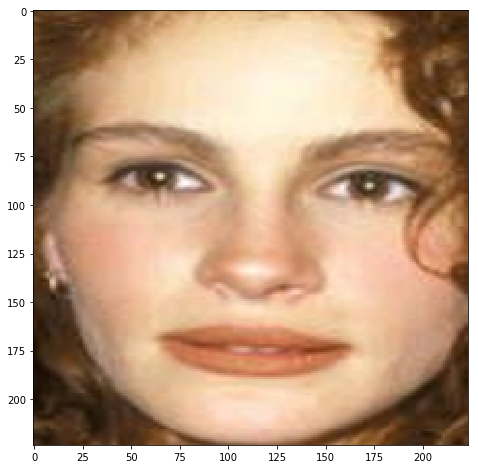

analyzing photo of Julia_Roberts_08.jpg
b' Andrea_Jeremiah': 19.919%
b' Jolene_Blalock': 8.992%
b' Alisar_Ailabouni': 8.621%
b' Marija_Vujovi\xc4\x87': 2.321%
b' Simmone_Jade_Mackinnon': 1.670%
------------------------------


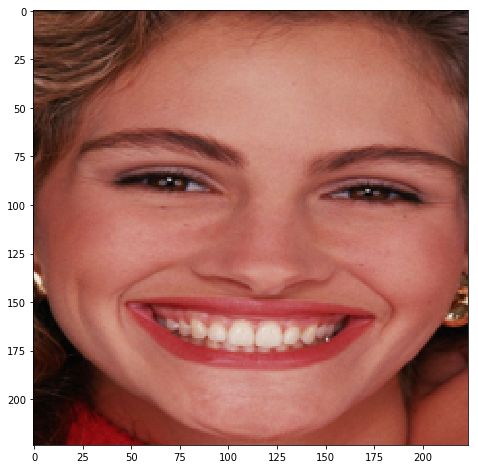

analyzing photo of Julia_Roberts_09.jpg
b' Diana_Bracho': 9.977%
b' In\xc3\xa8s_de_La_Fressange': 3.255%
b' Daniela_Urzi': 2.990%
b' Heather_Mitts': 2.725%
b' Andrea_Jeremiah': 2.348%
------------------------------


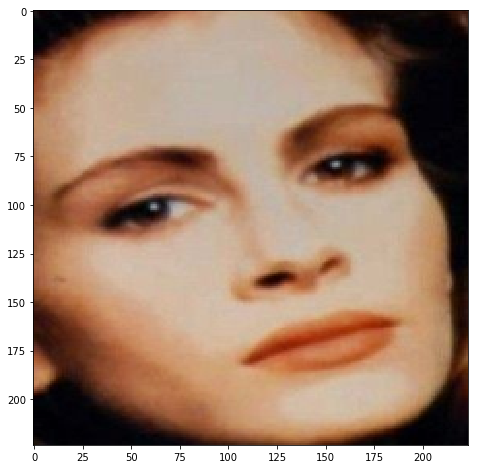

analyzing photo of Julia_Roberts_10.jpg
b' Hilda_Khalife': 3.631%
b' Lenka_Dusilov\xc3\xa1': 3.402%
b' Birgitta_Ohlsson': 2.272%
b' Debora_Caprioglio': 2.153%
b' Rika_Zara\xc3\xaf': 2.133%
------------------------------


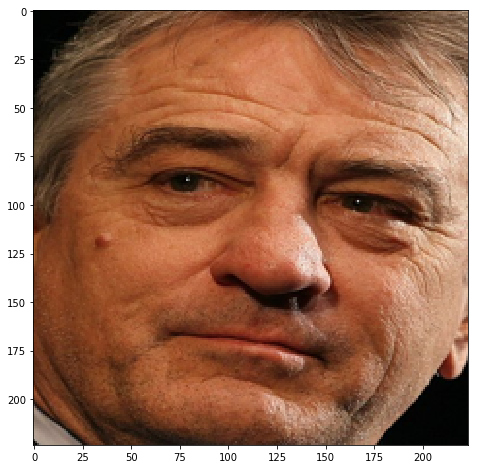

analyzing photo of Robert_De_Niro_01.jpg
b' Robert_De_Niro': 77.273%
b' Milutin_Mrkonji\xc4\x87': 3.907%
b' Fatih_Terim': 1.748%
b' Miguel_Herrera': 1.218%
b' Jean-Luc_M\xc3\xa9lenchon': 0.950%
------------------------------


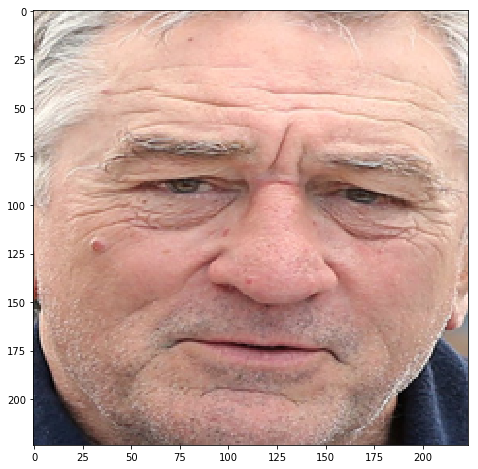

analyzing photo of Robert_De_Niro_02.jpg
b' Robert_De_Niro': 77.919%
b' Max_Mosley': 4.521%
b' J\xc3\xa1n_Slota': 2.065%
b' Eddy_Mitchell': 1.987%
b' Ron_Paul': 1.625%
------------------------------


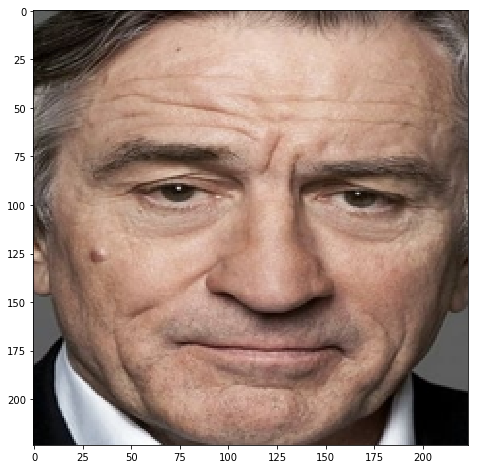

analyzing photo of Robert_De_Niro_03.jpg
b' Robert_De_Niro': 99.688%
b' Milutin_Mrkonji\xc4\x87': 0.027%
b' Christian_Clavier': 0.014%
b' Sylvester_Stallone': 0.011%
b' Max_Mosley': 0.010%
------------------------------


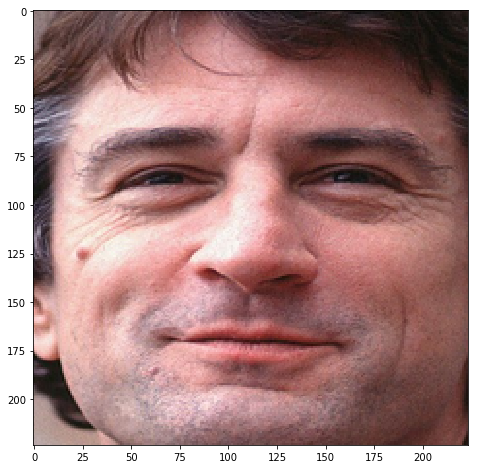

analyzing photo of Robert_De_Niro_04.jpg
b' Robert_De_Niro': 38.145%
b' Renaud_Capu\xc3\xa7on': 8.668%
b' Orlando_Bloom': 4.632%
b' Filip_Nikolic': 4.255%
b' Alberto_San_Juan': 4.189%
------------------------------


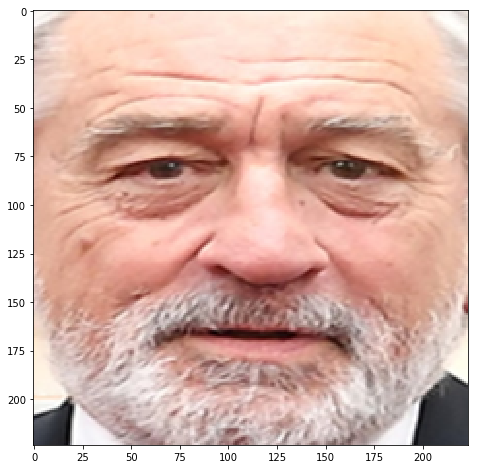

analyzing photo of Robert_De_Niro_05.jpg
b' Jan_Jakub_Kolski': 14.259%
b' Robert_De_Niro': 11.723%
b' Jos\xc3\xa9_Bov\xc3\xa9': 11.347%
b' S\xc3\xbcmer_Tilma\xc3\xa7': 8.376%
b' \xc4\xb0lber_Ortayl\xc4\xb1': 3.823%
------------------------------


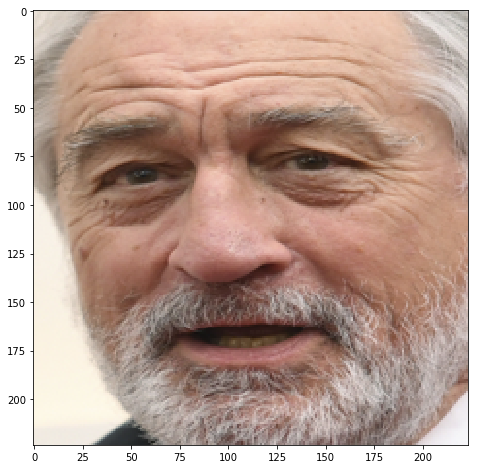

analyzing photo of Robert_De_Niro_06.jpg
b' Robert_De_Niro': 57.371%
b' \xc4\xb0lber_Ortayl\xc4\xb1': 2.189%
b' Jeremy_Corbyn': 2.045%
b' Milan_Lasica': 1.564%
b' Charlie_Musselwhite': 1.558%
------------------------------


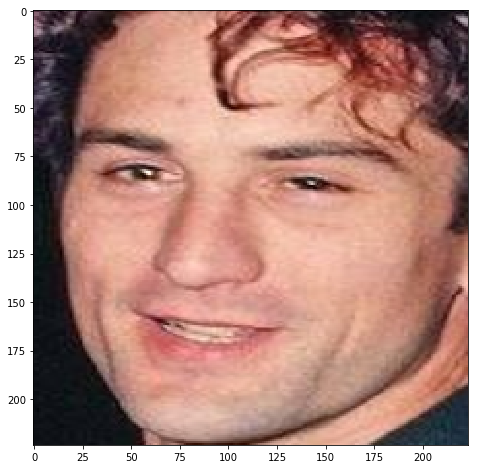

analyzing photo of Robert_De_Niro_07.jpg
b' Orlando_Bloom': 25.882%
b' Sergey_Lazarev': 6.661%
b' Ashton_Kutcher': 6.317%
b' Filip_Nikolic': 4.266%
b' Saulo_Fernandes': 3.255%
------------------------------


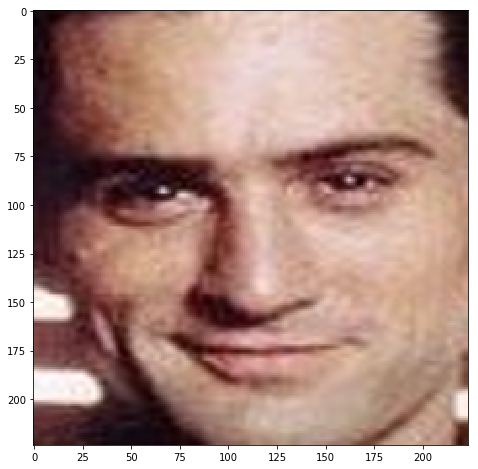

analyzing photo of Robert_De_Niro_08.jpg
b' H\xc3\xa9ctor_Barber\xc3\xa1': 5.860%
b' Sergey_Lazarev': 5.580%
b' Dweezil_Zappa': 4.118%
b' Guilherme_Marchi': 3.883%
b' Harry_Judd': 3.517%
------------------------------


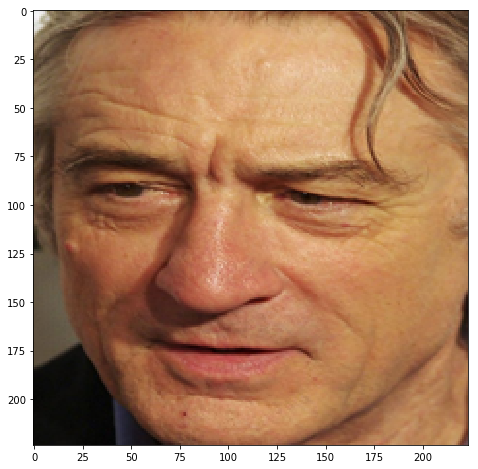

analyzing photo of Robert_De_Niro_09.jpg
b' Robert_De_Niro': 98.709%
b' Tomislav_Nikoli\xc4\x87': 0.103%
b' Davy_Russell': 0.098%
b' Clint_Hurdle': 0.059%
b' Carolina_Crescentini': 0.058%
------------------------------


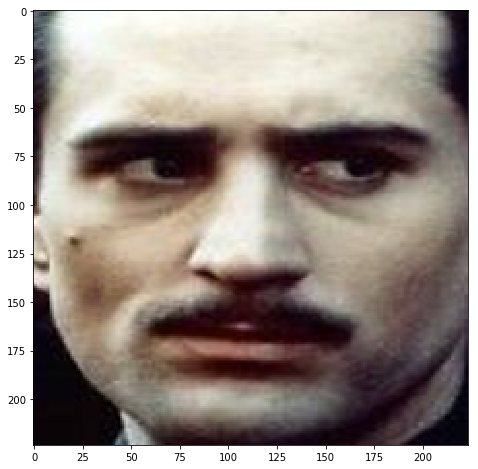

analyzing photo of Robert_De_Niro_10.jpg
b' Joaquin_Phoenix': 56.833%
b' Guilherme_Marchi': 8.480%
b' Gustav_Jung': 3.116%
b' Murat_Han': 2.332%
b' Dweezil_Zappa': 2.107%
------------------------------


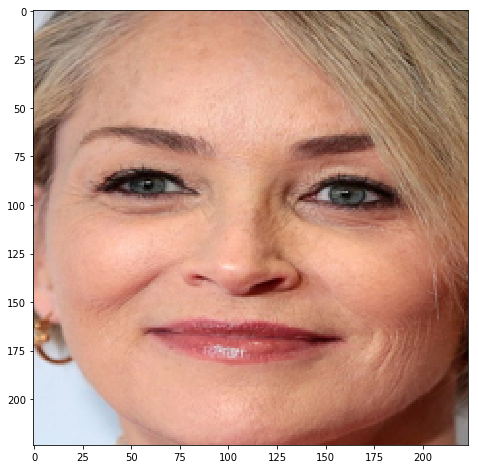

analyzing photo of Sharon_Stone_01.jpg
b' Sharon_Stone': 77.930%
b' Emma_Atkins': 4.860%
b' Elisabeth_R\xc3\xb6hm': 1.245%
b' Anita_Lipnicka': 0.981%
b' Pam_St._Clement': 0.625%
------------------------------


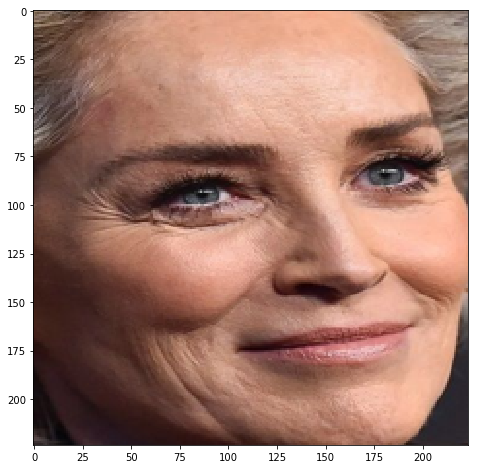

analyzing photo of Sharon_Stone_02.jpg
b' Sharon_Stone': 98.968%
b' Emma_Atkins': 0.361%
b' Tina_Maze': 0.178%
b' Demi_Moore': 0.033%
b' Anouck_Lep\xc3\xa8re': 0.029%
------------------------------


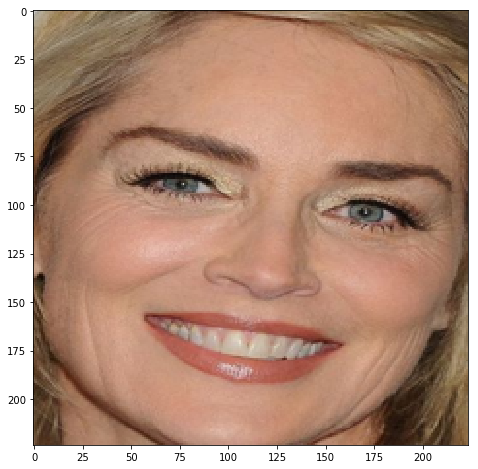

analyzing photo of Sharon_Stone_03.jpg
b' Sharon_Stone': 99.306%
b' Anouck_Lep\xc3\xa8re': 0.099%
b' Taylor_Cole': 0.073%
b' Noelle_Reno': 0.059%
b' Taylor_Schilling': 0.032%
------------------------------


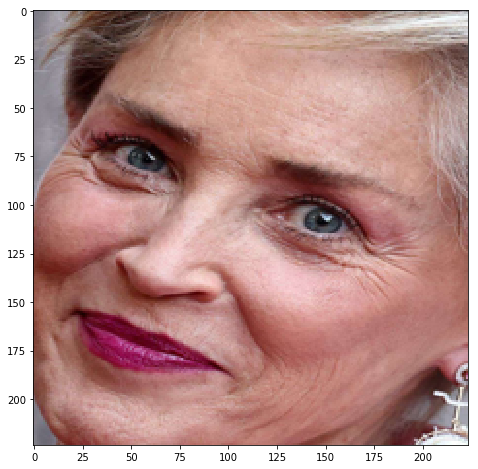

analyzing photo of Sharon_Stone_04.jpg
b' Sharon_Stone': 74.769%
b' Emma_Atkins': 10.851%
b' Sharon_Osbourne': 0.572%
b' Maria_Nazionale': 0.406%
b' Isabel_Varell': 0.349%
------------------------------


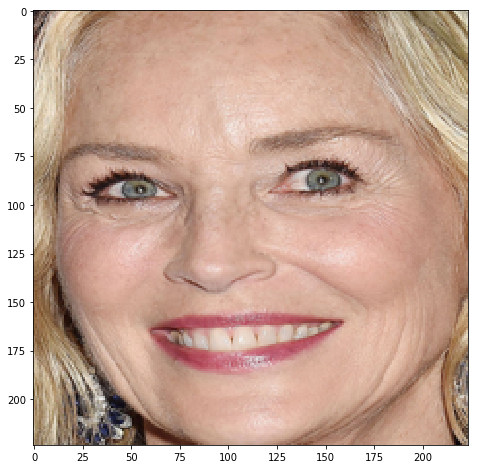

analyzing photo of Sharon_Stone_05.jpg
b' Sharon_Stone': 46.616%
b' Elisabeth_Shue': 15.595%
b' Anne_Linnet': 6.192%
b' Ursula_von_der_Leyen': 1.795%
b' Emma_Atkins': 1.696%
------------------------------


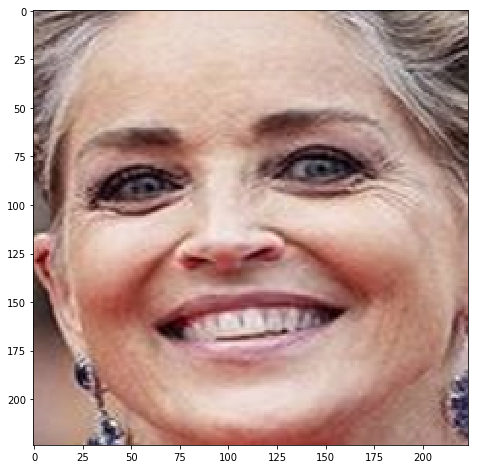

analyzing photo of Sharon_Stone_06.jpg
b' Sharon_Stone': 75.283%
b' Dannii_Minogue': 3.691%
b' Emma_Atkins': 3.082%
b' Irina_Bj\xc3\xb6rklund': 1.386%
b' Daniela_Romo': 1.294%
------------------------------


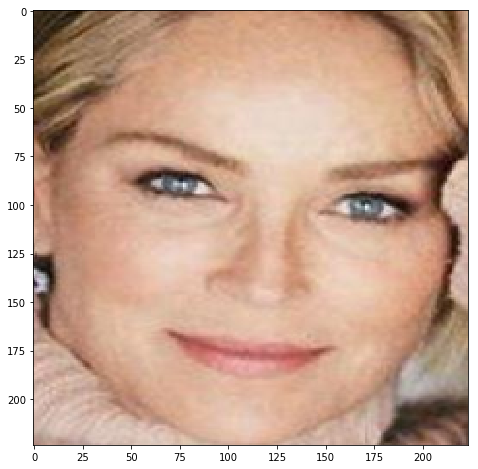

analyzing photo of Sharon_Stone_07.jpg
b' Sharon_Stone': 87.225%
b' Claudelle_Deckert': 1.513%
b' Tina_Maze': 0.658%
b' Rebecca_Romijn': 0.503%
b' Jennifer_Hawkins': 0.289%
------------------------------


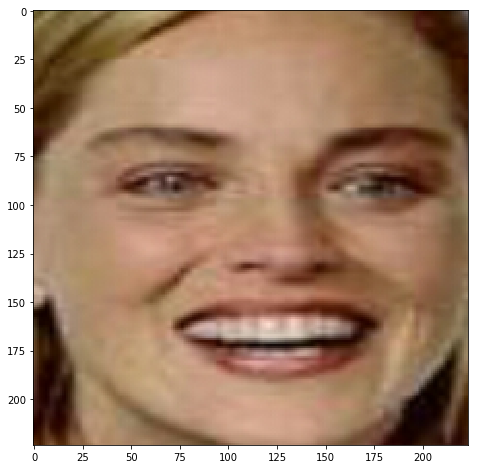

analyzing photo of Sharon_Stone_08.jpg
b' Sharon_Stone': 80.664%
b' Elli_Medeiros': 5.430%
b' Carolyn_Murphy': 1.329%
b' Taylor_Schilling': 0.640%
b' Beth_Winslet': 0.508%
------------------------------


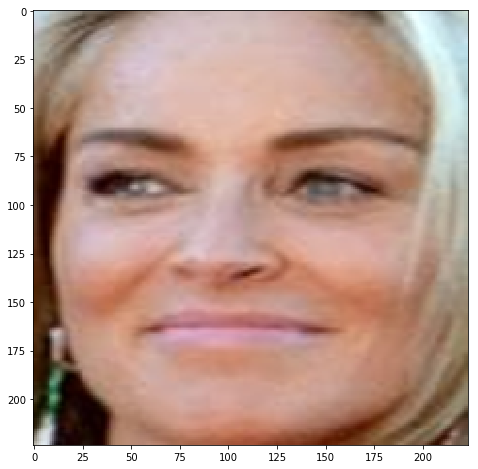

analyzing photo of Sharon_Stone_09.jpg
b' Sharon_Stone': 98.040%
b' Anita_Lipnicka': 0.319%
b' Kim-Lian': 0.189%
b' Emma_Atkins': 0.166%
b' Bobbi_Sue_Luther': 0.081%
------------------------------


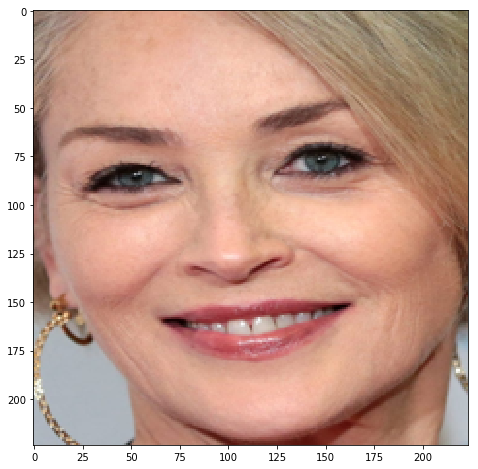

analyzing photo of Sharon_Stone_10.jpg
b' Sharon_Stone': 46.387%
b' Emma_Atkins': 3.461%
b' Simone_Hanselmann': 1.916%
b' Elisabeth_R\xc3\xb6hm': 1.762%
b' Ewa_Da_Cruz': 1.657%


In [12]:
for img in images:
    # load the photo and extract the face
    pixels = extract_face(dir_original + img)
    # pixels = cv2.rotate(pixels, cv2.ROTATE_90_CLOCKWISE)
    # pixels = cv2.flip(pixels, -1)
    print('------------------------------')
    pyplot.imshow(pixels)
    # show the plot
    pyplot.show()
    # convert one face into samples
    pixels = pixels.astype('float32')
    samples = expand_dims(pixels, axis=0)
    # prepare the face for the model, e.g. center pixels
    # samples = preprocess_input(samples, version=2)
    # perform prediction
    yhat = model.predict(samples)
    label = yhat.argmax()
    # convert prediction into names
    results = decode_predictions(yhat)
    # display most likely results
    print('analyzing photo of', img)
    for result in results[0]:
        print('%s: %.3f%%' % (result[0], result[1]*100))
    adversarial_image, noise = FGSM(samples, epsilon, label)
    adversarials.append(adversarial_image)
    noises.append(noise)
    imsave(dir_adv + 'Adv_eps_' + str(epsilon) + '_' +  img  , (adversarial_image[0]/255).numpy())
    embeddings_original.append(yhat)


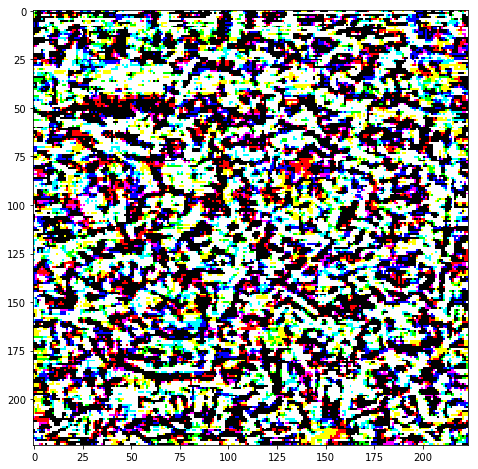

In [13]:
plt.imshow(noises[0][0]/epsilon/2+0.5)

In [14]:
# plt.imshow(adversarials[0][0]/255)

In [15]:
images_adv = os.listdir(dir_adv)
print(images_adv)

['Adv_eps_0.015_Angelina_Jolie_01.jpg', 'Adv_eps_0.015_Angelina_Jolie_02.jpg', 'Adv_eps_0.015_Angelina_Jolie_03.jpg', 'Adv_eps_0.015_Angelina_Jolie_04.jpg', 'Adv_eps_0.015_Angelina_Jolie_05.jpg', 'Adv_eps_0.015_Angelina_Jolie_06.jpg', 'Adv_eps_0.015_Angelina_Jolie_07.jpg', 'Adv_eps_0.015_Angelina_Jolie_08.jpg', 'Adv_eps_0.015_Angelina_Jolie_09.jpg', 'Adv_eps_0.015_Angelina_Jolie_10.jpg', 'Adv_eps_0.015_Brad_Pitt_01.jpg', 'Adv_eps_0.015_Brad_Pitt_02.jpg', 'Adv_eps_0.015_Brad_Pitt_03.jpg', 'Adv_eps_0.015_Brad_Pitt_04.jpg', 'Adv_eps_0.015_Brad_Pitt_05.jpg', 'Adv_eps_0.015_Brad_Pitt_06.jpg', 'Adv_eps_0.015_Brad_Pitt_07.jpg', 'Adv_eps_0.015_Brad_Pitt_08.jpg', 'Adv_eps_0.015_Brad_Pitt_09.jpg', 'Adv_eps_0.015_Brad_Pitt_10.jpg', 'Adv_eps_0.015_Emma_Stone_01.jpg', 'Adv_eps_0.015_Emma_Stone_02.jpg', 'Adv_eps_0.015_Emma_Stone_03.jpg', 'Adv_eps_0.015_Emma_Stone_04.jpg', 'Adv_eps_0.015_Emma_Stone_05.jpg', 'Adv_eps_0.015_Emma_Stone_06.jpg', 'Adv_eps_0.015_Emma_Stone_07.jpg', 'Adv_eps_0.015_Emma_Ston

------------------------------


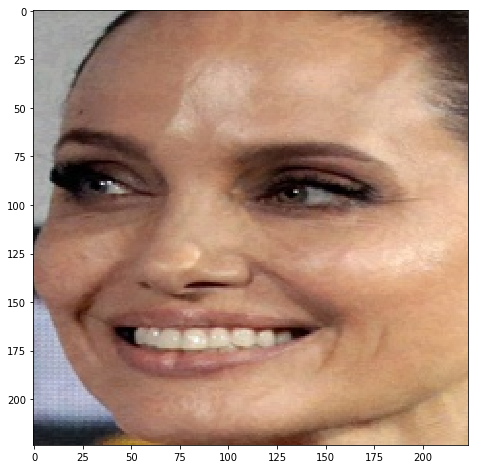

analyzing photo of Adv_eps_0.015_Angelina_Jolie_01.jpg
b' Emina_Jahovi\xc4\x87': 31.349%
b' Jeanne_Mas': 7.444%
b' Tu\xc4\x9fba_\xc3\x96zay': 4.478%
b' Rahul_Bose': 3.652%
b' Rozanna_Purcell': 3.114%
------------------------------


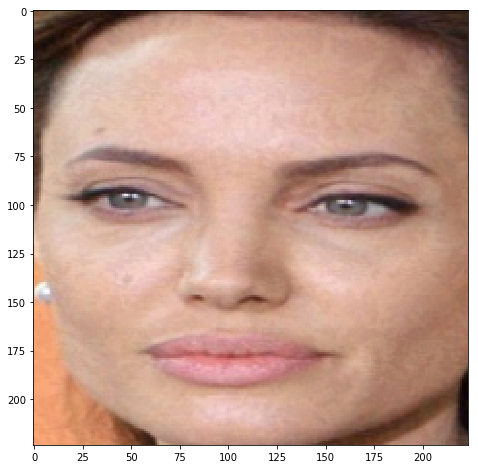

analyzing photo of Adv_eps_0.015_Angelina_Jolie_02.jpg
b' Genta_Ismajli': 14.985%
b' Sultan_Hurre': 5.918%
b' Patricia_Navidad': 3.829%
b' M\xc3\xa4dchen_Amick': 3.392%
b' Reka_Ebergenyi': 2.644%
------------------------------


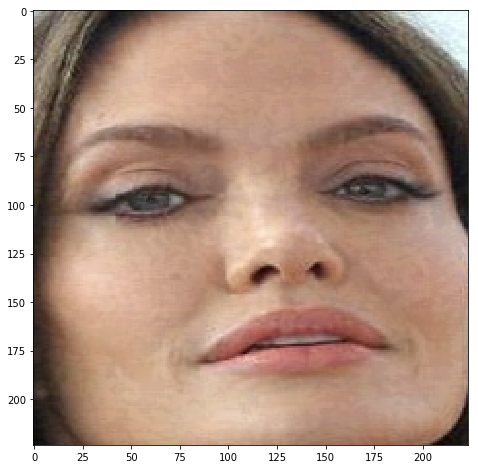

analyzing photo of Adv_eps_0.015_Angelina_Jolie_03.jpg
b' Deniz_Akkaya': 29.091%
b' B\xc3\xa1rbara_Palacios': 10.945%
b' Cristina_T\xc3\xa0rrega': 4.907%
b' Luciana_Curtis': 4.680%
b' \xc5\x9eevval_Sam': 2.893%
------------------------------


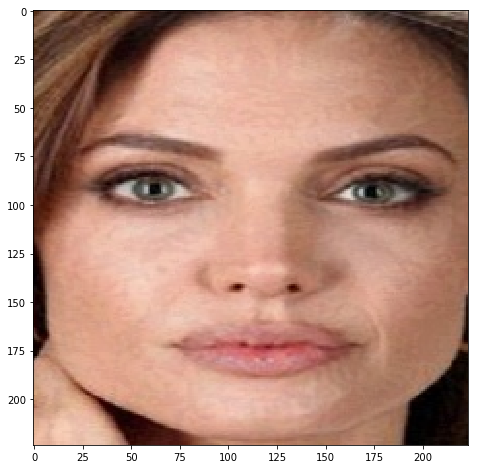

analyzing photo of Adv_eps_0.015_Angelina_Jolie_04.jpg
b' Nawal_Al_Zoghbi': 14.907%
b' Val\xc3\xa9rie_B\xc3\xa8gue': 14.457%
b' Maria_Canals_Barrera': 3.398%
b' Demet_Akal\xc4\xb1n': 2.518%
b' Maurren_Maggi': 1.883%
------------------------------


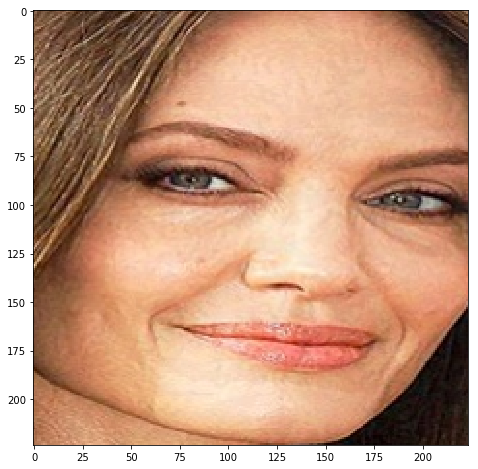

analyzing photo of Adv_eps_0.015_Angelina_Jolie_05.jpg
b' Shabana_Azmi': 20.143%
b' Pooja_Bhatt': 7.512%
b' Lu\xc3\xadza_Brunet': 6.712%
b' Scheila_Carvalho': 3.023%
b' Candan_Er\xc3\xa7etin': 2.284%
------------------------------


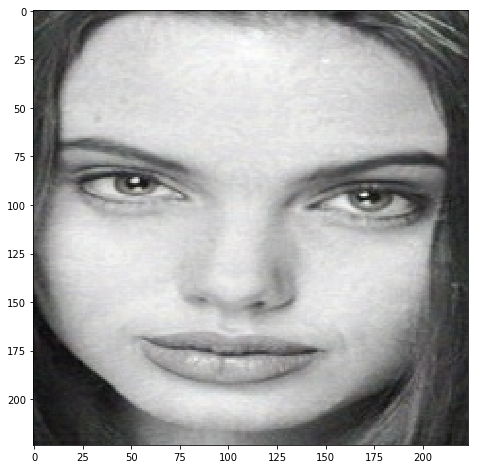

analyzing photo of Adv_eps_0.015_Angelina_Jolie_06.jpg
b' Elianne_Smit': 16.500%
b' Caitlin_Upton': 9.691%
b' Lisalla_Montenegro': 8.326%
b' Lindsey_Wixson': 4.704%
b' Delphine_Chan\xc3\xa9ac': 3.892%
------------------------------


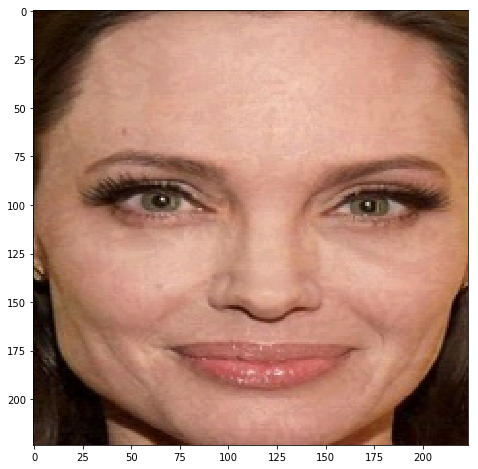

analyzing photo of Adv_eps_0.015_Angelina_Jolie_07.jpg
b' Danielle_Cormack': 6.214%
b' Meseda_Bagaudinova': 5.207%
b' Anne_Dudek': 3.861%
b' Alejandra_Barros': 2.330%
b' Carrie-Anne_Moss': 1.928%
------------------------------


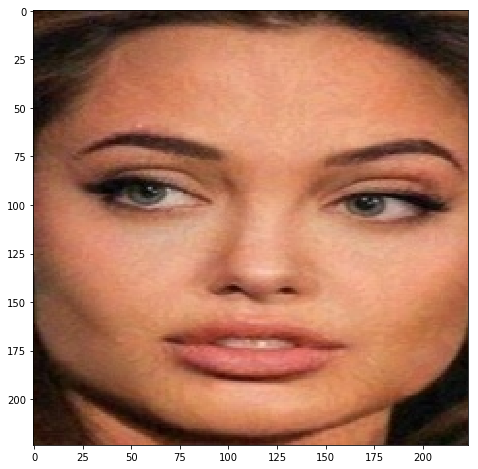

analyzing photo of Adv_eps_0.015_Angelina_Jolie_08.jpg
b' Karishma_Manandhar': 6.443%
b' Joana_Benedek': 3.393%
b' Bindu_Madhavi': 2.965%
b' Pooja_Bhatt': 2.914%
b' Namrata_Shirodkar': 2.878%
------------------------------


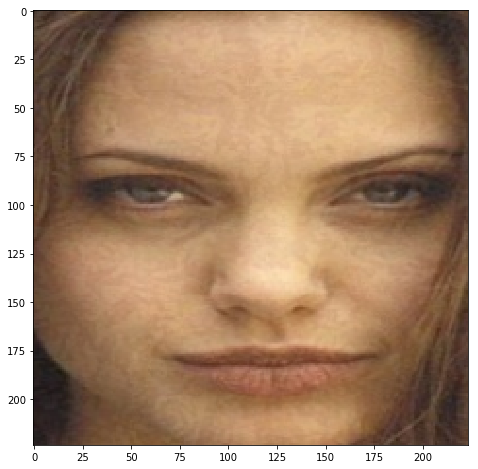

analyzing photo of Adv_eps_0.015_Angelina_Jolie_09.jpg
b' Amy_Brenneman': 15.940%
b' Fabiula_Nascimento': 4.925%
b' Katie_Price': 4.168%
b' Elisandra_Tomacheski': 3.708%
b' Pen\xc3\xa9lope_Menchaca': 3.508%
------------------------------


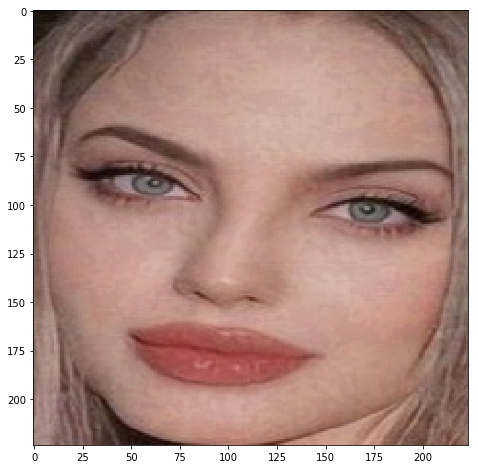

analyzing photo of Adv_eps_0.015_Angelina_Jolie_10.jpg
b' Maria_Gabriela_de_Far\xc3\xada': 33.055%
b' Elizabeth_Gillies': 3.587%
b' Elnaz_Shakerdoust': 1.662%
b' Madiha_Iftikhar': 1.558%
b' Kamya_Panjabi': 1.522%
------------------------------


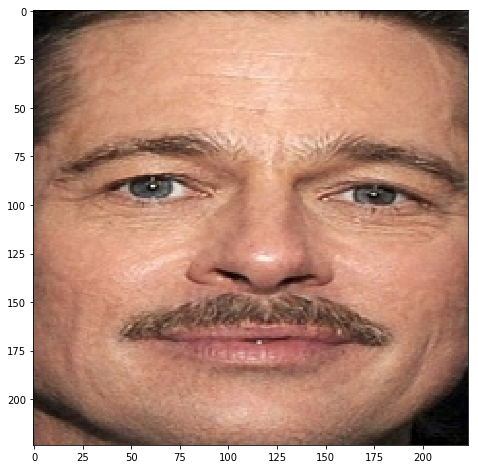

analyzing photo of Adv_eps_0.015_Brad_Pitt_01.jpg
b' Jack_Layton': 49.280%
b' Abd\xc3\xbcllatif_\xc5\x9eener': 31.819%
b' Aaron_Tippin': 5.720%
b' Luther_Vandross': 2.054%
b' Gilby_Clarke': 0.757%
------------------------------


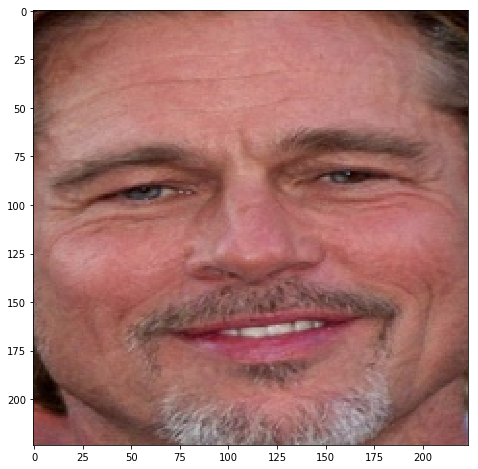

analyzing photo of Adv_eps_0.015_Brad_Pitt_02.jpg
b' James_Marsters': 21.167%
b' Dieter_Bohlen': 16.159%
b' Guy_Ecker': 4.758%
b' Jeff_Bridges': 2.138%
b' Adam_Sztaba': 1.965%
------------------------------


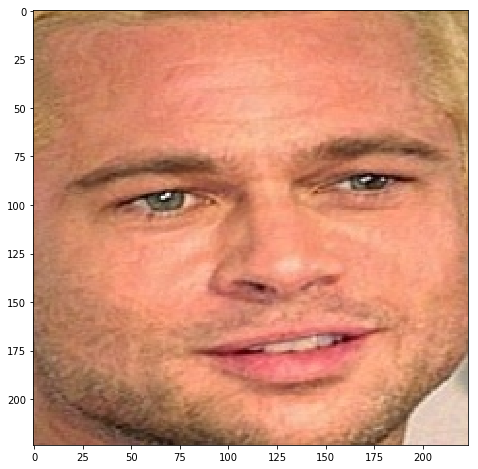

analyzing photo of Adv_eps_0.015_Brad_Pitt_03.jpg
b' David_Draiman': 31.010%
b' Josh_Koscheck': 7.323%
b' Daniel_Landa': 3.193%
b' G\xc3\xa1sp\xc3\xa1r_Laci': 2.483%
b' Maurice_de_Hond': 1.762%
------------------------------


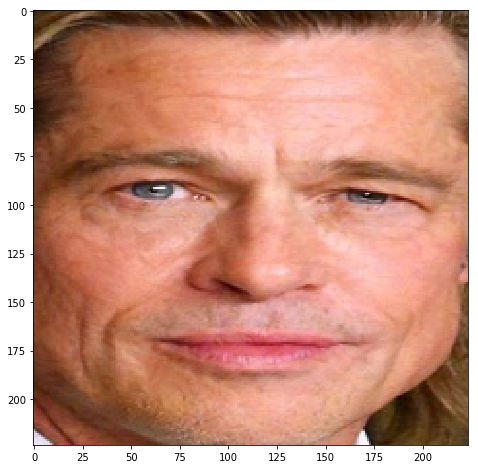

analyzing photo of Adv_eps_0.015_Brad_Pitt_04.jpg
b' Tom_Berenger': 14.387%
b' Dag_Otto_Lauritzen': 4.253%
b' Rainhard_Fendrich': 3.116%
b' Bertrand_Piccard': 2.250%
b' Sam_Champion': 2.015%
------------------------------


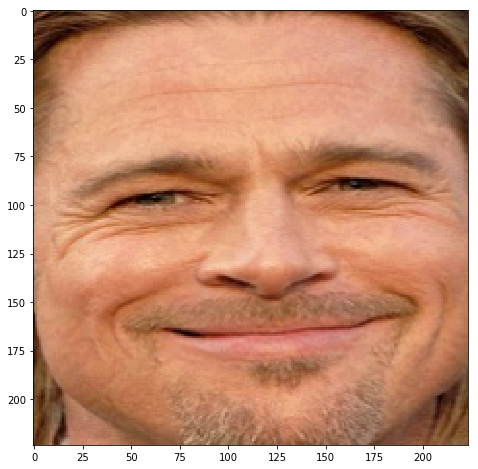

analyzing photo of Adv_eps_0.015_Brad_Pitt_05.jpg
b' Brad_Pitt': 23.185%
b' Rob_Lowe': 13.319%
b' Fernando_Colunga': 10.442%
b' Christopher_Nolan': 5.162%
b' Daniel_Landa': 4.874%
------------------------------


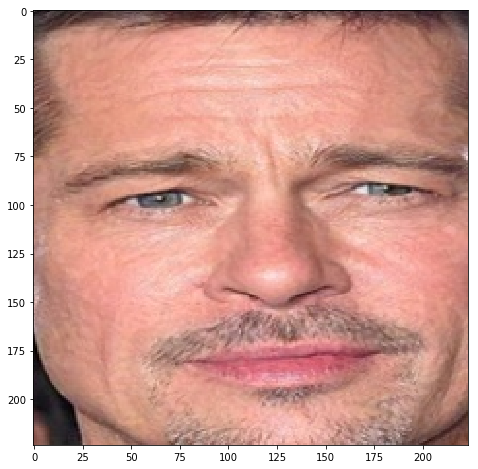

analyzing photo of Adv_eps_0.015_Brad_Pitt_06.jpg
b' Brad_Pitt': 85.546%
b' Sebastian_Spence': 2.527%
b' Nick_Faldo': 0.683%
b' Jeroen_van_der_Boom': 0.678%
b' David_Hasselhoff': 0.632%
------------------------------


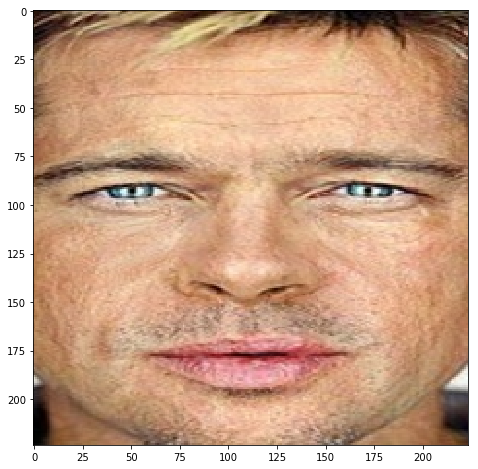

analyzing photo of Adv_eps_0.015_Brad_Pitt_07.jpg
b' Tomasz_Karolak': 6.566%
b' Don_Airey': 4.511%
b' Alain_Vigneault': 2.958%
b' Ole_Einar_Bj\xc3\xb8rndalen': 2.940%
b' Jason_Blum': 2.382%
------------------------------


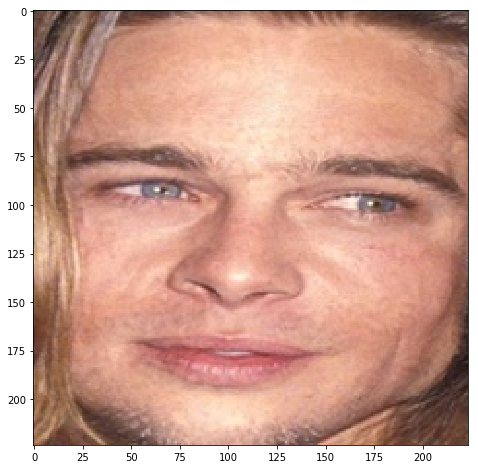

analyzing photo of Adv_eps_0.015_Brad_Pitt_08.jpg
b' David_Hallyday': 13.451%
b' Fabri_Fibra': 6.720%
b' Yngwie_Malmsteen': 4.067%
b' Gabrielle_Anwar': 2.786%
b' Christopher_Nolan': 2.438%
------------------------------


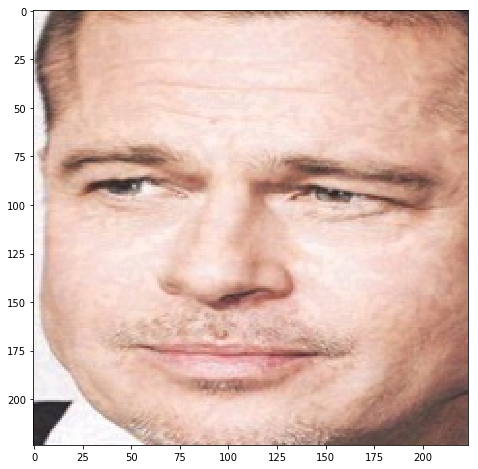

analyzing photo of Adv_eps_0.015_Brad_Pitt_09.jpg
b' Charley_Pride': 14.978%
b' Nick_Faldo': 4.621%
b' Jakub_Smol\xc3\xadk': 3.760%
b' Daniel_Landa': 2.640%
b' Antonio_Banderas': 2.633%
------------------------------


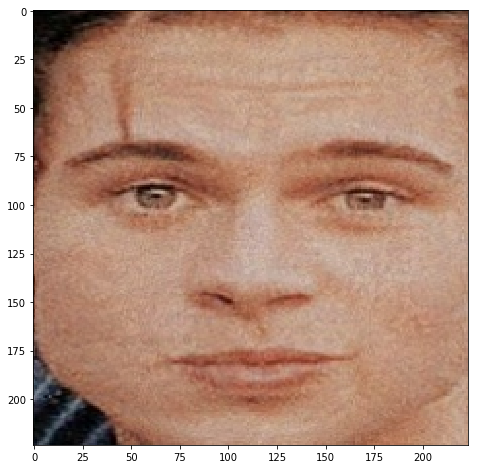

analyzing photo of Adv_eps_0.015_Brad_Pitt_10.jpg
b' Jonathan_Groff': 32.885%
b' Yngwie_Malmsteen': 14.448%
b' Dweezil_Zappa': 10.217%
b' Almir_Sater': 4.234%
b' Amy_Diamond': 3.368%
------------------------------


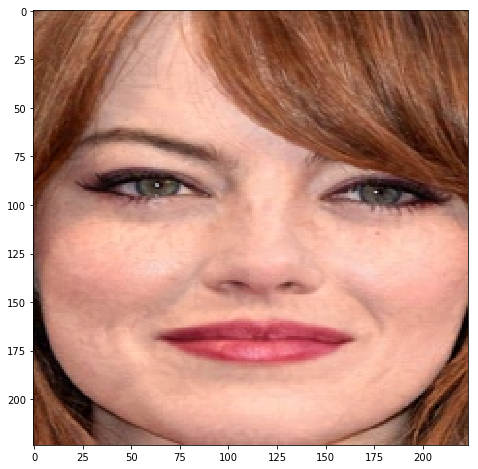

analyzing photo of Adv_eps_0.015_Emma_Stone_01.jpg
b' Sultan_Hurre': 17.902%
b' M\xc3\xa4dchen_Amick': 12.403%
b' Miriam_Pielhau': 3.273%
b' Natalie_Dreyfuss': 2.764%
b' Kate_Hudson': 2.112%
------------------------------


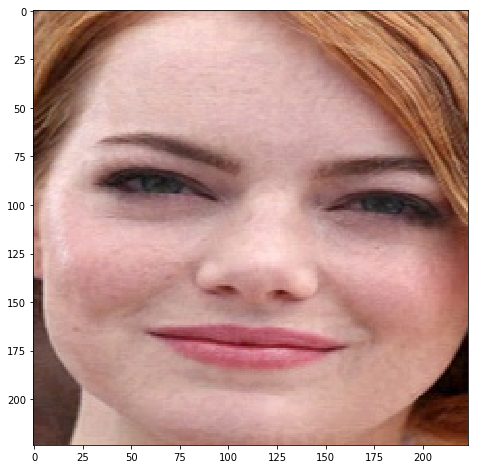

analyzing photo of Adv_eps_0.015_Emma_Stone_02.jpg
b' Elizabeth_Gillies': 17.372%
b' Jewel_Mische': 11.047%
b' Ximena_Navarrete': 5.300%
b' Ana_Paula_Ar\xc3\xb3sio': 3.560%
b' Nefise_Karatay': 1.388%
------------------------------


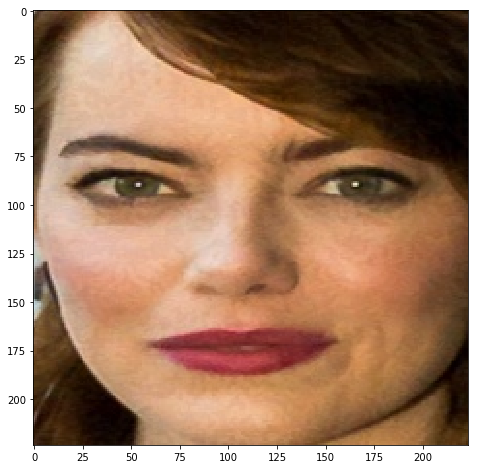

analyzing photo of Adv_eps_0.015_Emma_Stone_03.jpg
b' Kamilla_Baar': 11.767%
b' Laurie_David': 6.572%
b' Eva_Herman': 4.247%
b' Monica_Guerritore': 3.930%
b' Julia_Kl\xc3\xb6ckner': 3.641%
------------------------------


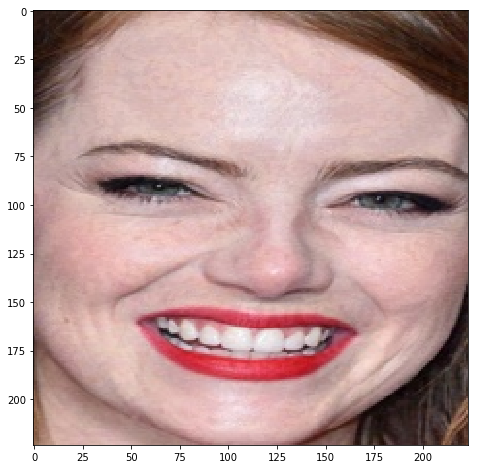

analyzing photo of Adv_eps_0.015_Emma_Stone_04.jpg
b' Ebru_G\xc3\xbcnde\xc5\x9f': 45.587%
b' Ellen_Rocche': 15.700%
b' Carolina_G\xc3\xb3mez': 2.554%
b' Jessica_Stroup': 1.653%
b' Pooja_Bose': 1.191%
------------------------------


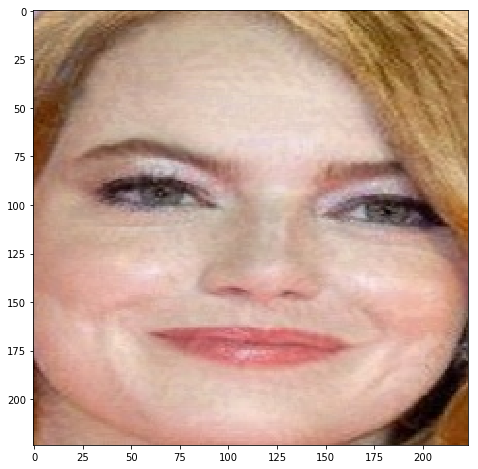

analyzing photo of Adv_eps_0.015_Emma_Stone_05.jpg
b' Jewel_Mische': 9.301%
b' Leonora_Jakupi': 7.266%
b' M\xc3\xa4dchen_Amick': 3.009%
b' Ellen_Rocche': 2.233%
b' Patr\xc3\xadcia_Pillar': 1.962%
------------------------------


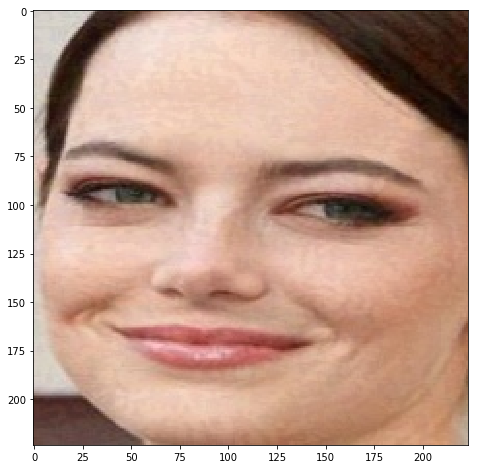

analyzing photo of Adv_eps_0.015_Emma_Stone_06.jpg
b' Stefan\xc3\xada_Fern\xc3\xa1ndez': 7.538%
b' Coraima_Torres': 6.041%
b' Emma_Heming': 4.582%
b' Ellen_Rocche': 4.308%
b' Laura_Cosoi': 3.764%
------------------------------


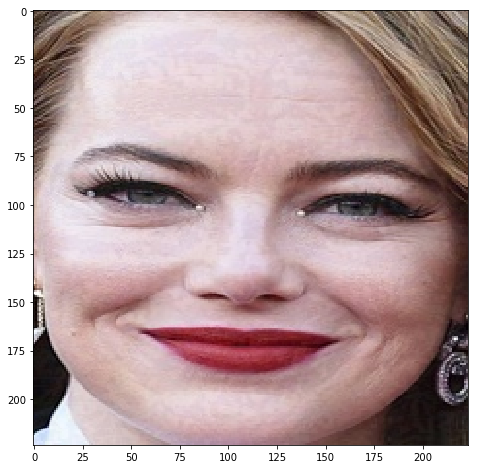

analyzing photo of Adv_eps_0.015_Emma_Stone_07.jpg
b' Monica_Guerritore': 59.488%
b' Eva_Herman': 5.706%
b' Dayle_Haddon': 3.498%
b' Laurie_David': 2.240%
b' Vildan_Atasever': 1.886%
------------------------------


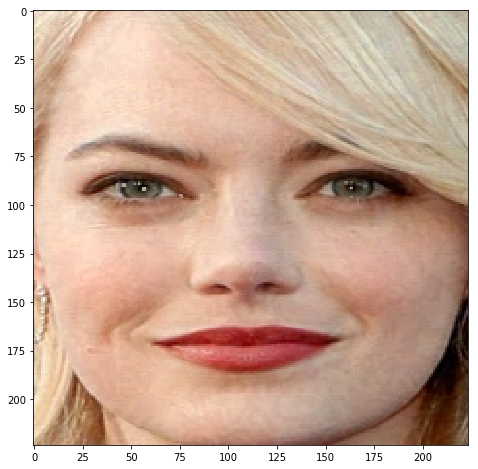

analyzing photo of Adv_eps_0.015_Emma_Stone_08.jpg
b' Analeigh_Tipton': 25.936%
b' Hailey_Clauson': 11.710%
b' Elyse_Taylor': 6.000%
b' Caitlin_Upton': 4.903%
b' Carina_Vogt': 2.569%
------------------------------


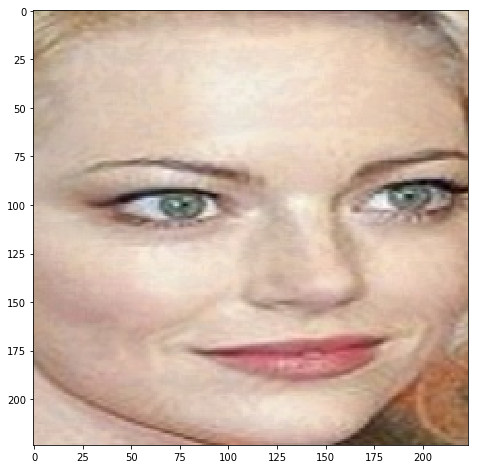

analyzing photo of Adv_eps_0.015_Emma_Stone_09.jpg
b' Natalia_W\xc3\xb6rner': 7.505%
b' Carolyn_Murphy': 3.576%
b' Marie_B\xc3\xa4umer': 2.870%
b' Jennifer_Tilly': 2.197%
b' Laurie_David': 2.157%
------------------------------


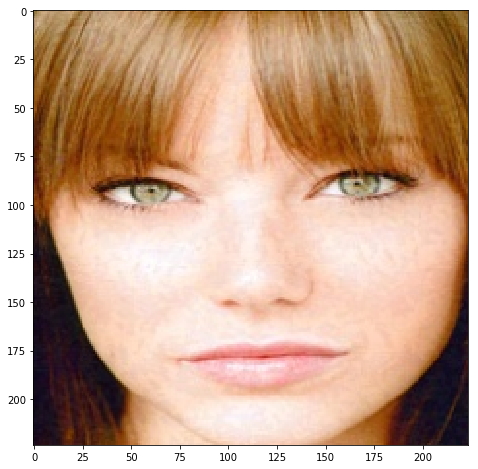

analyzing photo of Adv_eps_0.015_Emma_Stone_10.jpg
b' Roma_G\xc4\x85siorowska': 6.442%
b' Rachael_Yamagata': 4.951%
b' Indiana_Evans': 4.491%
b' Barbi_Benton': 3.208%
b' Gabriele_Pauli': 3.077%
------------------------------


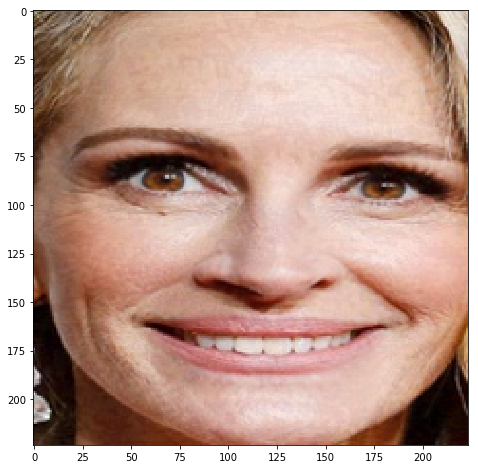

analyzing photo of Adv_eps_0.015_Julia_Roberts_01.jpg
b' Michelle_Clunie': 28.486%
b' Agnieszka_Maciag': 4.123%
b' Alexandra_Kamp': 4.019%
b' Kirsty_Gallacher': 3.951%
b' Sandrine_Corman': 3.809%
------------------------------


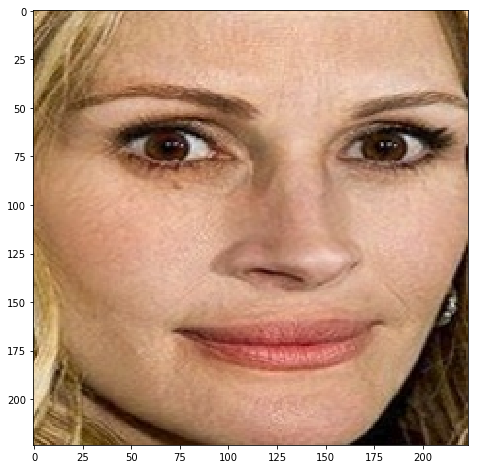

analyzing photo of Adv_eps_0.015_Julia_Roberts_02.jpg
b' Funda_Arar': 15.442%
b' Monika_Mrozowska': 4.734%
b' Bridget_Hall': 3.802%
b' Natalya': 3.708%
b' Danielle_Cormack': 3.101%
------------------------------


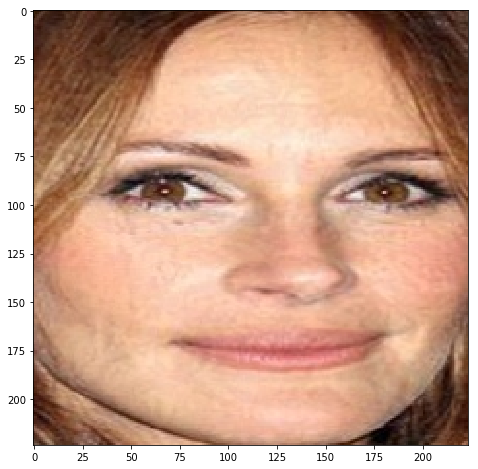

analyzing photo of Adv_eps_0.015_Julia_Roberts_03.jpg
b' Mariska_Hargitay': 18.185%
b' Nora_Salinas': 5.589%
b' Roc\xc3\xado_Jurado': 3.240%
b' Dina_Pugliese': 2.262%
b' Faf\xc3\xa1_de_Bel\xc3\xa9m': 2.188%
------------------------------


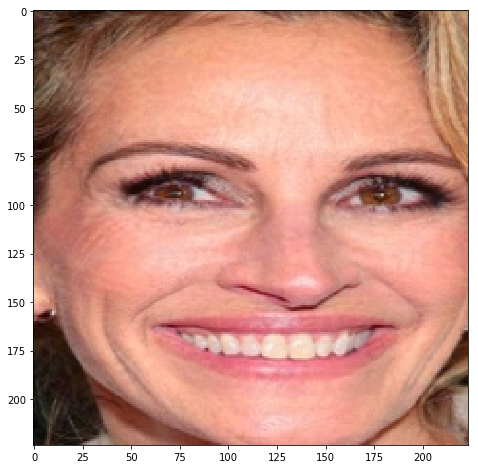

analyzing photo of Adv_eps_0.015_Julia_Roberts_04.jpg
b' Inma_Shara': 11.835%
b' Lili_Estefan': 8.801%
b' Camille_Anderson': 7.880%
b' Sandrine_Corman': 4.954%
b' Florencia_Pe\xc3\xb1a': 4.390%
------------------------------


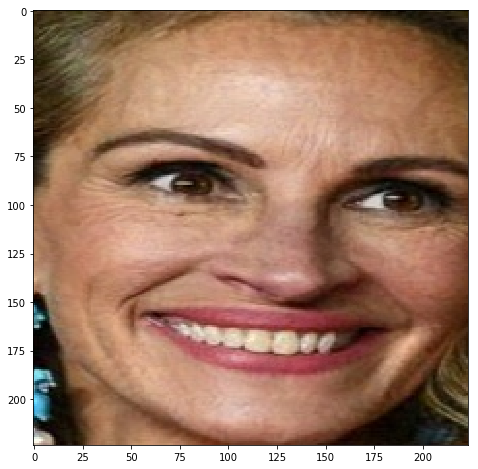

analyzing photo of Adv_eps_0.015_Julia_Roberts_05.jpg
b' Kina_Malpartida': 43.042%
b' Rebecca_Immanuel': 6.935%
b' Regina_Duarte': 3.993%
b' Zabou_Breitman': 3.523%
b' Ana_Mil\xc3\xa1n': 2.214%
------------------------------


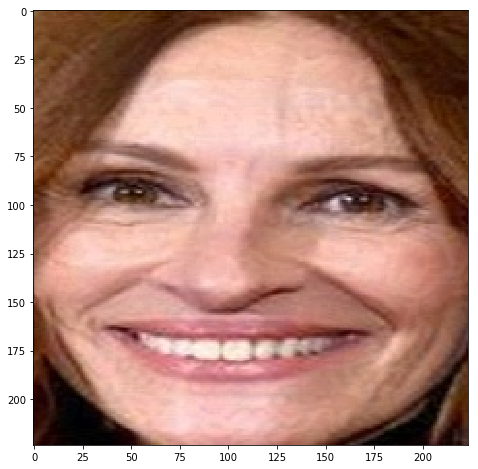

analyzing photo of Adv_eps_0.015_Julia_Roberts_06.jpg
b' Mariska_Hargitay': 58.140%
b' Melanie_Olivares': 17.052%
b' Davina_McCall': 2.440%
b' Tina_Fey': 2.354%
b' Ay\xc5\x9feg\xc3\xbcl_Aldin\xc3\xa7': 1.424%
------------------------------


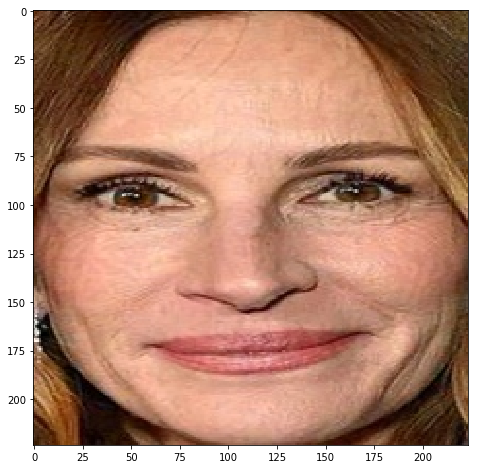

analyzing photo of Adv_eps_0.015_Julia_Roberts_07.jpg
b' Birgitta_Ohlsson': 29.029%
b' Magdalena_Schejbal': 10.688%
b' Leisha_Hailey': 5.386%
b' Vanessa_Demouy': 3.806%
b' Anne_Dudek': 2.740%
------------------------------


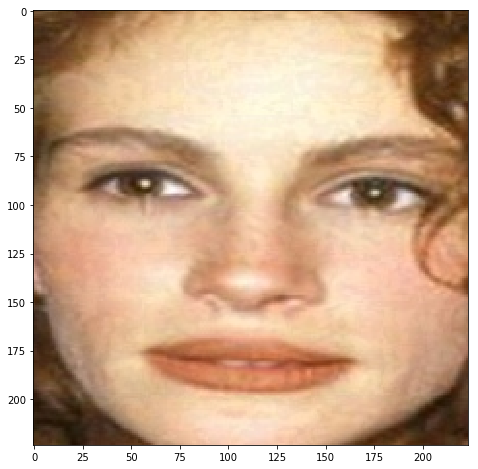

analyzing photo of Adv_eps_0.015_Julia_Roberts_08.jpg
b' Jolene_Blalock': 77.150%
b' Daniela_Urzi': 13.956%
b' Alisar_Ailabouni': 3.071%
b' Veerle_Baetens': 0.278%
b' Bette_Franke': 0.237%
------------------------------


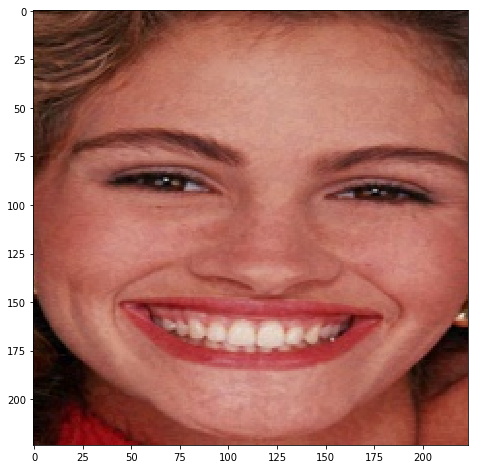

analyzing photo of Adv_eps_0.015_Julia_Roberts_09.jpg
b' Paula_Patton': 8.120%
b' Marcela_Acu\xc3\xb1a': 7.993%
b' Andrea_Jeremiah': 7.736%
b' Kausha_Rach': 5.992%
b' Jessy_Mendiola': 5.956%
------------------------------


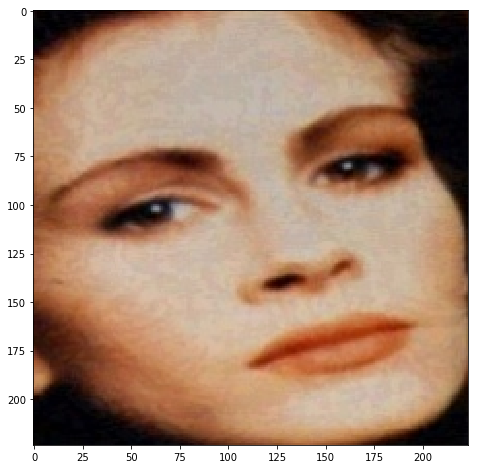

analyzing photo of Adv_eps_0.015_Julia_Roberts_10.jpg
b' Rika_Zara\xc3\xaf': 23.544%
b' Faf\xc3\xa1_de_Bel\xc3\xa9m': 8.436%
b' Lenka_Dusilov\xc3\xa1': 4.204%
b' Russell_Means': 3.243%
b' Kari_Bremnes': 3.060%
------------------------------


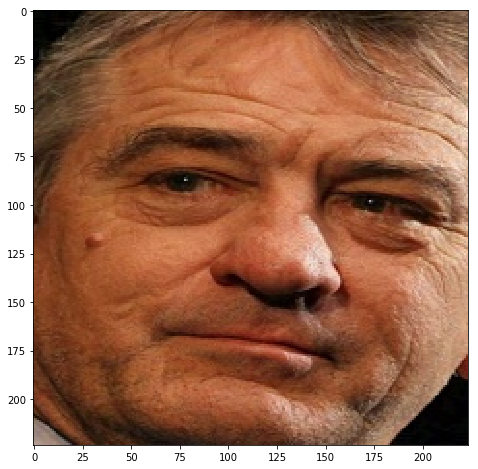

analyzing photo of Adv_eps_0.015_Robert_De_Niro_01.jpg
b' Jean-Luc_M\xc3\xa9lenchon': 37.191%
b' Raymond_Blanc': 11.056%
b' Miguel_Herrera': 8.176%
b' Y\xc4\xb1lmaz_Vural': 3.875%
b' Don_Airey': 3.431%
------------------------------


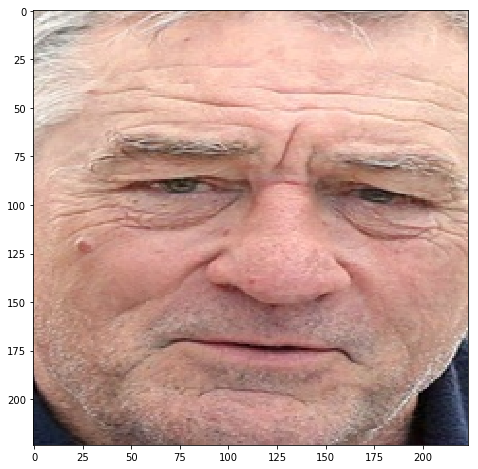

analyzing photo of Adv_eps_0.015_Robert_De_Niro_02.jpg
b' Max_Mosley': 47.724%
b' Sam_Zell': 33.572%
b' Ron_Paul': 3.343%
b' Eddy_Mitchell': 2.742%
b' J\xc3\xa1n_Slota': 0.892%
------------------------------


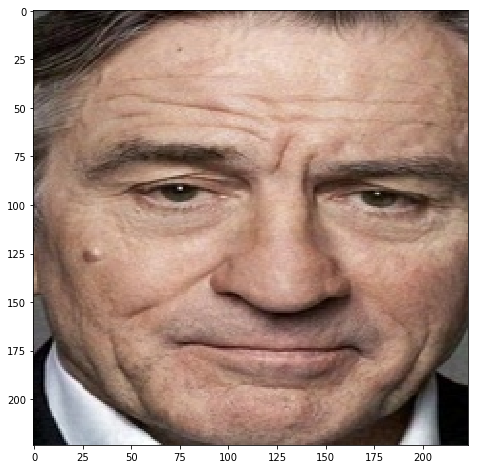

analyzing photo of Adv_eps_0.015_Robert_De_Niro_03.jpg
b' Max_Mosley': 10.049%
b' Milo\xc5\xa1_Zeman': 9.256%
b' Milan_Mandari\xc4\x87': 7.646%
b' Gervais_Martel': 5.205%
b' Robert_De_Niro': 3.248%
------------------------------


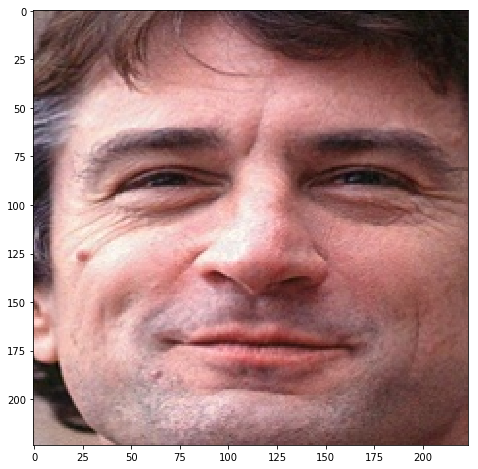

analyzing photo of Adv_eps_0.015_Robert_De_Niro_04.jpg
b' Renaud_Capu\xc3\xa7on': 23.465%
b' Josh_Hartnett': 10.910%
b' Filip_Nikolic': 5.248%
b' Bruno_Spengler': 4.789%
b' James_Marsters': 3.195%
------------------------------


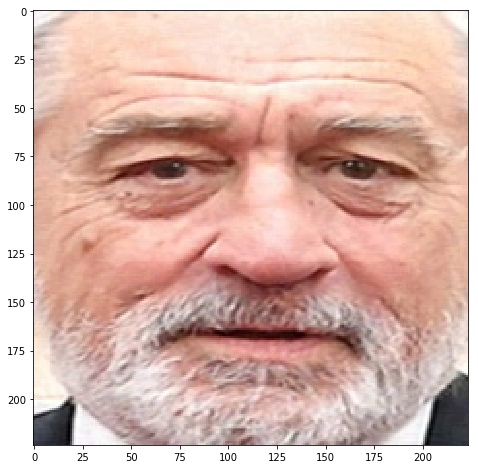

analyzing photo of Adv_eps_0.015_Robert_De_Niro_05.jpg
b' Robert_De_Niro': 38.655%
b' Jos\xc3\xa9_Bov\xc3\xa9': 6.690%
b' S\xc3\xbcmer_Tilma\xc3\xa7': 4.998%
b' Milan_Lasica': 3.159%
b' Walid_Jumblatt': 2.237%
------------------------------


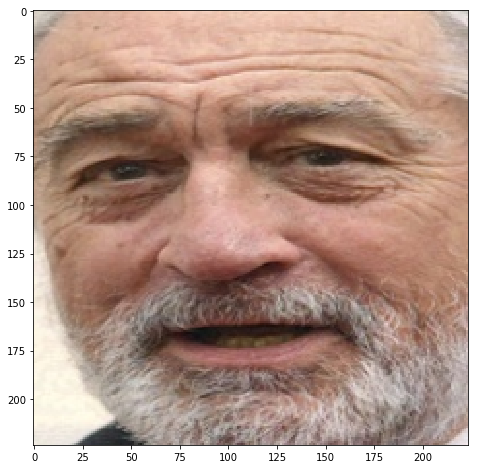

analyzing photo of Adv_eps_0.015_Robert_De_Niro_06.jpg
b' Jan_Jakub_Kolski': 33.908%
b' Prince_Michael_of_Kent': 12.315%
b' S\xc3\xbcmer_Tilma\xc3\xa7': 8.018%
b' Jeremy_Corbyn': 4.234%
b' Sam_Zell': 3.990%
------------------------------


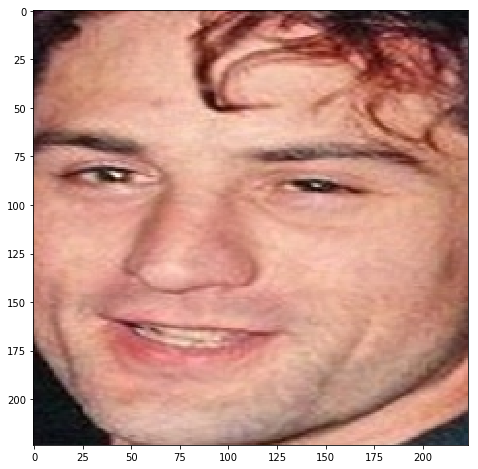

analyzing photo of Adv_eps_0.015_Robert_De_Niro_07.jpg
b' Filip_Nikolic': 8.107%
b' Pablo_Holman': 4.411%
b' Saulo_Fernandes': 4.133%
b' Beau_Ryan': 2.846%
b' Jeremy_Gilbert': 2.316%
------------------------------


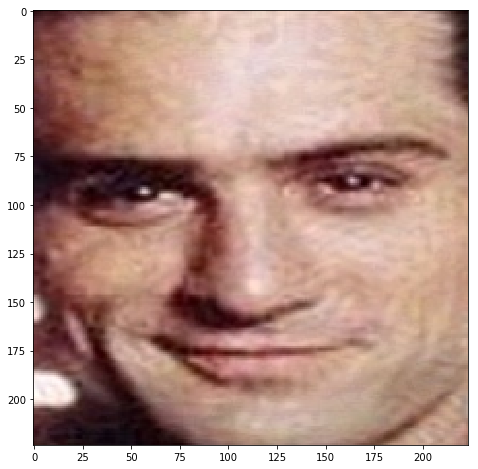

analyzing photo of Adv_eps_0.015_Robert_De_Niro_08.jpg
b' Dejan_Stankovic': 3.592%
b' Nacer_Chadli': 3.592%
b' Rachid_Taha': 3.434%
b' Colin_Kaepernick': 3.285%
b' Benjamin_Siksou': 3.137%
------------------------------


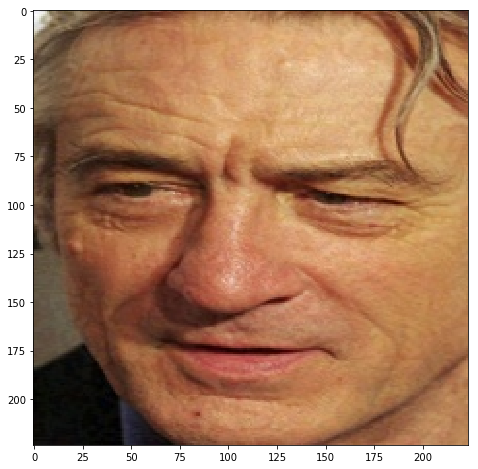

analyzing photo of Adv_eps_0.015_Robert_De_Niro_09.jpg
b' Dick_Wolf': 6.183%
b' Jean-Pierre_Pernaut': 5.586%
b' Clint_Hurdle': 3.856%
b' Robert_Redford': 3.825%
b' Eddy_Mitchell': 2.331%
------------------------------


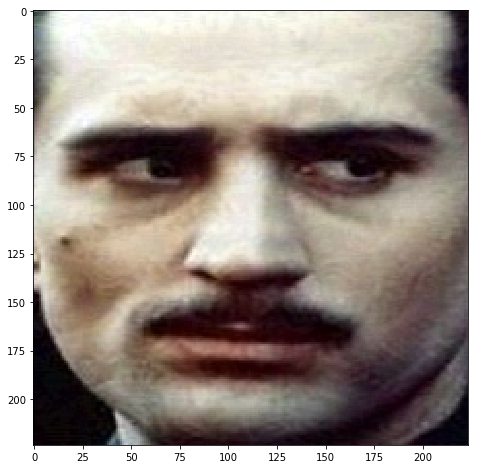

analyzing photo of Adv_eps_0.015_Robert_De_Niro_10.jpg
b' Murat_Han': 34.574%
b' Thierry_Lhermitte': 7.857%
b' Gamal_Mubarak': 6.896%
b' Jonathan_Knight': 5.870%
b' Guilherme_Marchi': 4.976%
------------------------------


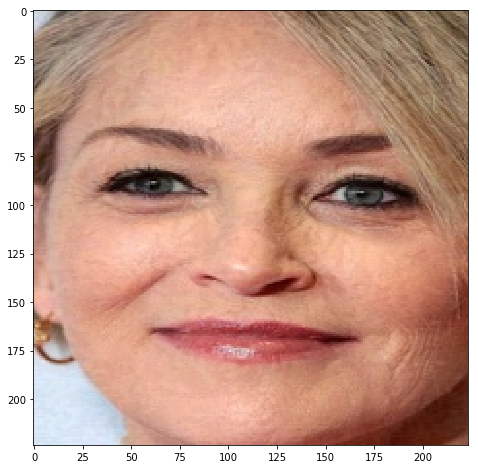

analyzing photo of Adv_eps_0.015_Sharon_Stone_01.jpg
b' Roseanne_Barr': 29.509%
b' Kim-Lian': 18.076%
b' Kemal_Dervi\xc5\x9f': 3.677%
b' Emma_Atkins': 2.835%
b' Pam_St._Clement': 1.904%
------------------------------


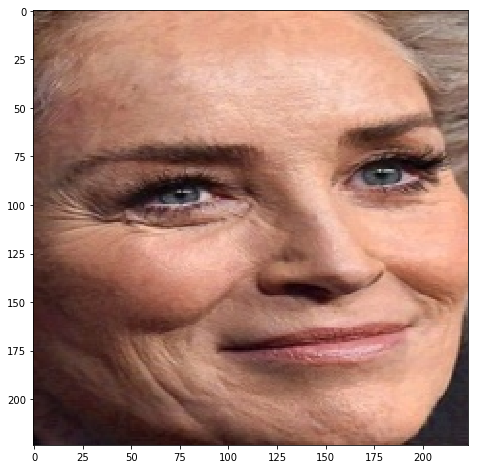

analyzing photo of Adv_eps_0.015_Sharon_Stone_02.jpg
b' Tallulah_Belle_Willis': 22.114%
b' Tina_Maze': 20.699%
b' Lucie_Jones': 8.059%
b' Emma_Atkins': 5.598%
b' \xc3\x89lodie_Bouchez': 3.026%
------------------------------


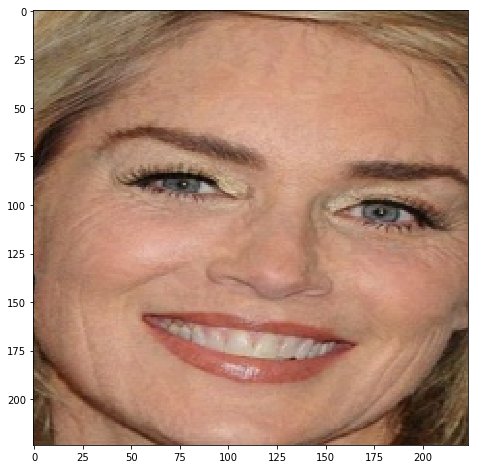

analyzing photo of Adv_eps_0.015_Sharon_Stone_03.jpg
b' Nicolette_van_Dam': 31.361%
b' Rachael_Taylor': 18.227%
b' Filippa_Hamilton': 10.757%
b' Anouck_Lep\xc3\xa8re': 8.165%
b' Zsuzsanna_Jakabos': 4.047%
------------------------------


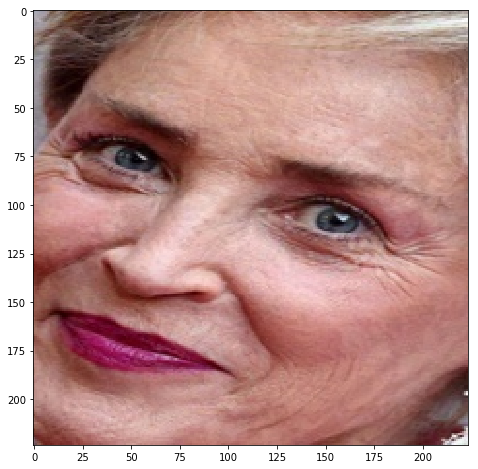

analyzing photo of Adv_eps_0.015_Sharon_Stone_04.jpg
b' Simone_Singh': 9.770%
b' Faf\xc3\xa1_de_Bel\xc3\xa9m': 5.191%
b' Gabriela_Michetti': 4.646%
b' Ir\xc3\xa1n_Castillo': 4.544%
b' Emma_Atkins': 3.682%
------------------------------


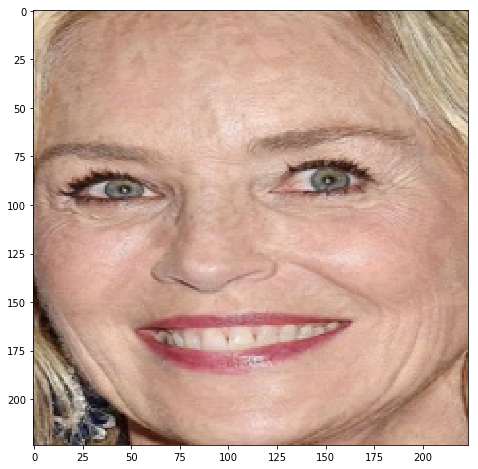

analyzing photo of Adv_eps_0.015_Sharon_Stone_05.jpg
b' Eliza_Coupe': 8.132%
b' Elisabeth_Shue': 7.884%
b' Mariella_Frostrup': 5.707%
b' Cecilia_Bolocco': 5.143%
b' Odilo_Scherer': 4.846%
------------------------------


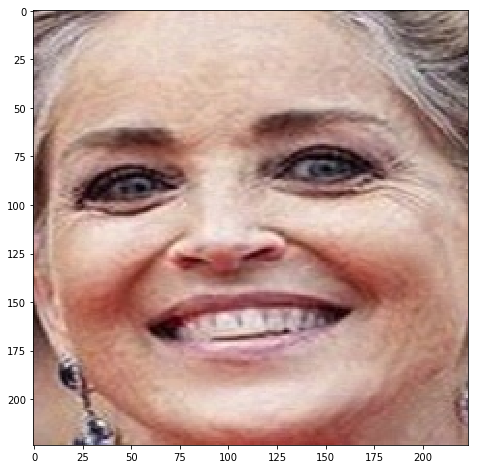

analyzing photo of Adv_eps_0.015_Sharon_Stone_06.jpg
b' Daniela_Romo': 19.152%
b' Emma_Atkins': 10.221%
b' Kim-Lian': 9.957%
b' Sally_Nugent': 5.912%
b' Irina_Bj\xc3\xb6rklund': 2.896%
------------------------------


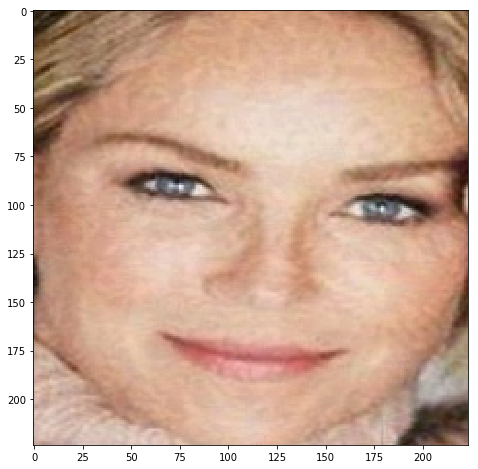

analyzing photo of Adv_eps_0.015_Sharon_Stone_07.jpg
b' Ellen_Pompeo': 11.805%
b' Vanessa_Hessler': 10.909%
b' Rachael_Taylor': 6.174%
b' Leonora_Jakupi': 4.225%
b' Jennifer_Hawkins': 3.704%
------------------------------


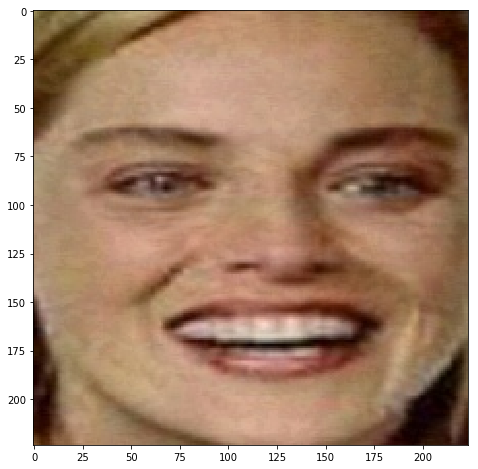

analyzing photo of Adv_eps_0.015_Sharon_Stone_08.jpg
b' Elli_Medeiros': 63.957%
b' Lupita_Jones': 2.581%
b' Anne_Consigny': 1.251%
b' Michelle_Rodriguez': 1.238%
b' Nastassja_Kinski': 1.148%
------------------------------


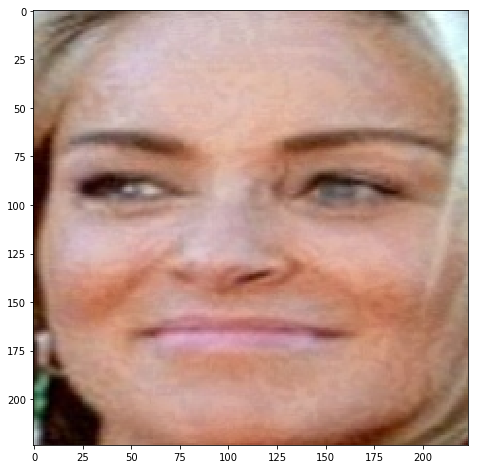

analyzing photo of Adv_eps_0.015_Sharon_Stone_09.jpg
b' Kim-Lian': 89.186%
b' Dira_Paes': 2.433%
b' Bobbi_Sue_Luther': 1.249%
b' Agnieszka_Maciag': 0.849%
b' Maura_Rivera': 0.692%
------------------------------


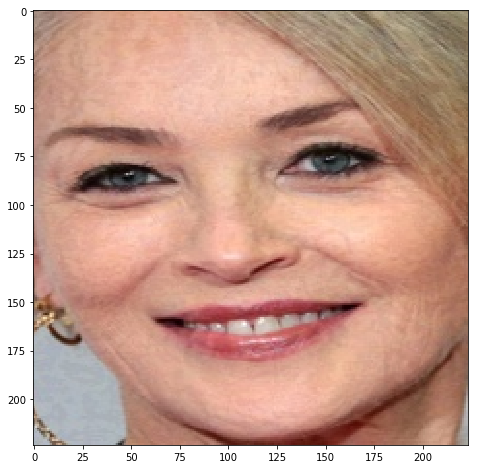

analyzing photo of Adv_eps_0.015_Sharon_Stone_10.jpg
b' Kim-Lian': 43.867%
b' Rosanne_Cash': 4.981%
b' Gail_Porter': 4.895%
b' Carolina_G\xc3\xb3mez': 1.919%
b' Roseanne_Barr': 1.402%


In [16]:
for img in images_adv:
    # load the photo and extract the face
    pixels = extract_face(dir_adv + img)
    # pixels = cv2.rotate(pixels, cv2.ROTATE_90_CLOCKWISE)
    # pixels = cv2.flip(pixels, -1)
    print('------------------------------')
    pyplot.imshow(pixels)
    # show the plot
    pyplot.show()
    # convert one face into samples
    pixels = pixels.astype('float32')
    samples = expand_dims(pixels, axis=0)
    # prepare the face for the model, e.g. center pixels
    # samples = preprocess_input(samples, version=2)
    # perform prediction
    yhat = model.predict(samples)
    label = yhat.argmax()
    # convert prediction into names
    results = decode_predictions(yhat)
    # display most likely results
    print('analyzing photo of', img)
    for result in results[0]:
        print('%s: %.3f%%' % (result[0], result[1]*100))

In [17]:
# extract faces and calculate face embeddings for a list of photo files
def get_embeddings(directory, filenames, model):
    # extract faces
    faces = [extract_face(directory+f) for f in filenames]
    # convert into an array of samples
    samples = asarray(faces, 'float32')
    # prepare the face for the model, e.g. center pixels
    samples = preprocess_input(samples, version=2)
    # create a vggface model before the classifier part, to create the feature vector
    model = VGGFace(model='resnet50', include_top=False, input_shape=(224, 224, 3), pooling='avg')
    # perform prediction
    yhat = model.predict(samples)
    return yhat

In [18]:
# determine if a candidate face is a match for a known face
def is_match(known_embedding, candidate_embedding, threshold=0.5):
    # calculate distance between embeddings
    score = cosine(known_embedding, candidate_embedding)
    # if score <= threshold:
    #    print('>face is a Match (%.3f <= %.3f)' % (score, threshold))
    # else:
    #    print('>face is NOT a Match (%.3f > %.3f)' % (score, threshold))
    return score

In [19]:
embeddings_original = get_embeddings(dir_original,images,model)
embeddings_adv = get_embeddings(dir_adv,images_adv,model)

In [20]:
embeddings_original

array([[0.0000000e+00, 5.4717102e+00, 3.5734518e+00, ..., 3.2466025e+00,
        0.0000000e+00, 2.8270698e-01],
       [0.0000000e+00, 2.7928541e+00, 0.0000000e+00, ..., 8.2342190e-01,
        6.5723628e-01, 4.1293871e-01],
       [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 1.2536882e+00,
        0.0000000e+00, 9.0428954e-03],
       ...,
       [0.0000000e+00, 9.9640207e+00, 1.0906411e+00, ..., 0.0000000e+00,
        3.6726043e+00, 7.9266328e-01],
       [1.6580595e-01, 2.1824072e-01, 0.0000000e+00, ..., 6.9739418e+00,
        6.3305078e+00, 1.6561015e+00],
       [0.0000000e+00, 9.1273528e-01, 2.3796325e+00, ..., 0.0000000e+00,
        3.9119728e+00, 0.0000000e+00]], dtype=float32)

In [21]:
col1 = []
col2 = []
col3 = []
for idx,img in enumerate(images):
    for j in range(idx,len(images)):
        score = is_match(embeddings_original[idx], embeddings_original[j])
        col1.append(img)
        col2.append(images[j])
        col3.append(score)
        
        
d = {'Base': col1, 'Other': col2, 'Score': col3}
df_score = pd.DataFrame(data=d)
df_score['Same Person'] = 'Yes'
df_score.loc[df_score['Score']>0.5,'Same Person'] = 'No'
df_score.to_csv('Score_Original_'+ str(epsilon) +'.csv')

In [22]:
df_score

,Base,Other,Score,Same Person
0,Angelina_Jolie_01.jpg,Angelina_Jolie_01.jpg,0.000000,Yes
1,Angelina_Jolie_01.jpg,Angelina_Jolie_02.jpg,0.262608,Yes
2,Angelina_Jolie_01.jpg,Angelina_Jolie_03.jpg,0.436559,Yes
3,Angelina_Jolie_01.jpg,Angelina_Jolie_04.jpg,0.363254,Yes
4,Angelina_Jolie_01.jpg,Angelina_Jolie_05.jpg,0.351205,Yes
5,Angelina_Jolie_01.jpg,Angelina_Jolie_06.jpg,0.539017,No
6,Angelina_Jolie_01.jpg,Angelina_Jolie_07.jpg,0.268401,Yes
7,Angelina_Jolie_01.jpg,Angelina_Jolie_08.jpg,0.476122,Yes
8,Angelina_Jolie_01.jpg,Angelina_Jolie_09.jpg,0.484213,Yes
9,Angelina_Jolie_01.jpg,Angelina_Jolie_10.jpg,0.550177,No


In [23]:
col1 = []
col2 = []
col3 = []
for idx,img in enumerate(images):
    for j in range(idx,len(images_adv)):
        score = is_match(embeddings_original[idx], embeddings_adv[j])
        col1.append(img)
        col2.append(images_adv[j])
        col3.append(score)
        
        
d = {'Base': col1, 'Other': col2, 'Score': col3}
df_score_adv = pd.DataFrame(data=d)
df_score_adv['Same Person'] = 'Yes'
df_score_adv.loc[df_score_adv['Score']>0.5,'Same Person'] = 'No'
df_score_adv.to_csv('Score_Adv_'+ str(epsilon) +'.csv')

In [24]:
df_score_adv

,Base,Other,Score,Same Person
0,Angelina_Jolie_01.jpg,Adv_eps_0.015_Angelina_Jolie_01.jpg,0.133449,Yes
1,Angelina_Jolie_01.jpg,Adv_eps_0.015_Angelina_Jolie_02.jpg,0.366868,Yes
2,Angelina_Jolie_01.jpg,Adv_eps_0.015_Angelina_Jolie_03.jpg,0.471215,Yes
3,Angelina_Jolie_01.jpg,Adv_eps_0.015_Angelina_Jolie_04.jpg,0.491695,Yes
4,Angelina_Jolie_01.jpg,Adv_eps_0.015_Angelina_Jolie_05.jpg,0.404735,Yes
5,Angelina_Jolie_01.jpg,Adv_eps_0.015_Angelina_Jolie_06.jpg,0.550400,No
6,Angelina_Jolie_01.jpg,Adv_eps_0.015_Angelina_Jolie_07.jpg,0.369650,Yes
7,Angelina_Jolie_01.jpg,Adv_eps_0.015_Angelina_Jolie_08.jpg,0.489514,Yes
8,Angelina_Jolie_01.jpg,Adv_eps_0.015_Angelina_Jolie_09.jpg,0.451311,Yes
9,Angelina_Jolie_01.jpg,Adv_eps_0.015_Angelina_Jolie_10.jpg,0.538274,No
